In [1]:
import sys
import warnings
warnings.filterwarnings('ignore')
import os

import pickle
import pandas as pd
import numpy as np
import h5py
import os
import tqdm
from tqdm import tnrange as trange

import seaborn as sns
import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
mpl.rcParams['svg.fonttype'] = 'none'
sns.set_context('poster', font_scale=1.1)
cmap = plt.rcParams['axes.prop_cycle'].by_key()['color']

import scipy
from scipy import signal
from scipy.signal import butter, filtfilt,freqz, find_peaks, resample,lfilter
from scipy.stats import norm,entropy,linregress, ttest_rel
from scipy.optimize import minimize, curve_fit
from scipy.io import savemat
from scipy.special import erf

#modulename = 'multiprocess'
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split, cross_val_score, permutation_test_score, StratifiedKFold, GroupKFold
from sklearn.cluster import AffinityPropagation, DBSCAN
from sklearn.decomposition import PCA
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

import pingouin as pg


from functions_beh import*
from odor_breathing_functions import*

def cell_compiler(cell_list):

    ncells = len(cell_list)
    ntrials = len(cell_list[0]['spike_times'])
    counts = 1000
    test_cell = np.zeros((ncells, ntrials,counts)) 

    for i in range(ncells):
        cellid = cell_list[i]
        for trial in range(ntrials):

            if isinstance(cellid['spike_times'][trial], np.ndarray):  # Check if the item is a NumPy array
                if cellid['spike_times'][trial].size == 0:  # Check if the array is empty
                    trial_spikes = 0
                    #print("This subarray is empty")
                elif cellid['spike_times'][trial].size == 1:  # Check if the array contains a single element
                    #print(f"This is a single-element array: {cellid['spike_times'][trial]}")
                    test_cell[i,trial,0] = cellid['spike_times'][trial]
                else:
                    trial_spikes = cellid['spike_times'][trial]
                    for spk in range(len(trial_spikes)):
                        test_cell[i,trial,spk] = trial_spikes[spk]


    test_cell[test_cell==0] = np.nan
    return test_cell, ncells

def code_compiler(data_list, cell_list):

    ncells = len(cell_list)
    ntrials = len(cell_list[0]['spike_times'])
    bins = 100
    test_cell = np.zeros((ncells, ntrials,bins)) 

    for i in range(ncells):
        test_cell[i,:,:] = data_list['x_est_'+str(i)]
   
    return test_cell

In [5]:
path_cell = os.getcwd() + '/HW_Data/pack_data_new/'
fname = 'Bengal_20190430_0.pickle'
#fname = 'Banner_20220315_1.pickle'

# all_high_trials = np.zeros((0,))
# all_cum_odor = np.zeros((0,))

cell_fname = path_cell + 'cell_' + fname

with open(cell_fname,'rb') as handle:
    cell_list = pickle.load(handle)
    cell = cell_list[6]
    #print(cell)
    #print()#.keys())

    num_trials = cell['num_trials']
    print(num_trials)
    #cell_id = cell[6]
    #print(cell_id)
    #print(len(cell_id))#.sum(1))
    spike_times = cell['spike_times'][0]
    firing_rate = cell['firing_rate'][0]
    #print(firing_rate)
    #print(spike_times)
    

                            
#     #autocorr_list.append(get_autocorr(session,num_hist))
#     session['conv_trial_odor'],session['conv_weights'] = get_conv_odor(session)
#     session['sniff_durations'] = get_sniff_durations(session)
#     non_idle_trials = np.invert(session['idle_trials'])
#     print(len(non_idle_trials), non_idle_trials.sum())
#     # early_trials = session['early_trials']
#     # print(len(early_trials), early_trials.sum())

#     correct_trials = session['correct_trials'][non_idle_trials]
#     #print(len(correct_trials))

#     high_trials = session['high_trials'][non_idle_trials]
#     low_trials = session['low_trials'][non_idle_trials]
#     high_choices = (correct_trials==high_trials)
#     trial_odor = session['trial_odor'][non_idle_trials]
#     sniff_durations = session['sniff_durations'][non_idle_trials]
#     sniff_durations = sniff_durations[sniff_durations>0] 
#     #pasting all the sniff durations of the session in just one array
#     sniff_hist = get_sniff_histogram(session,False)[non_idle_trials]
#     # odor_onset = find_odor_onsets_new(trial_odor)#.astype(np.float)
#     #coef_var  = get_blanks_duration(odor_onset)[1]
#     sniff_hist_shuffled = get_sniff_histogram(session,True)[non_idle_trials]
#     cum_odor = np.ceil(trial_odor.sum(axis=1)/5000)
#     #num_trials_taken = len(high_trials) - num_hist
#     #previous_ind = np.arange(num_trials_taken).reshape(-1,1)+np.arange(0,num_hist)
#     #previous_trials = high_choices[previous_ind]

# all_cum_odor = np.append(all_cum_odor,cum_odor)

# #print(high_trials[:6])

# high_seven = all_cum_odor>8
# low_eight = all_cum_odor<=8
# all_high_trials = np.append(all_high_trials, high_trials)
# all_low_trials = np.invert(all_high_trials.astype(bool))
# bad_trials_1 = np.logical_and(high_seven,all_low_trials)
# bad_trials_2 = np.logical_and(low_eight,all_high_trials)
# bad_trials = np.logical_or(bad_trials_1,bad_trials_2)
# good_trials = np.invert(bad_trials)
# print(good_trials.sum())
# print(np.argwhere(bad_trials==True))


# all_correct_trials = all_correct_trials[good_trials]
# all_correct_trials_hist = all_correct_trials_hist[good_trials_hist]
# all_high_trials = all_high_trials[good_trials]
# all_high_trials_hist = all_high_trials_hist[good_trials_hist]
# all_low_trials = all_low_trials[good_trials]
# all_low_trials_hist = all_low_trials_hist[good_trials_hist]
# all_high_choices = all_high_choices[good_trials]
# all_coef_vars = all_coef_vars[good_trials]
# all_cum_odor = all_cum_odor[good_trials]
# all_trial_odor = all_trial_odor[good_trials,:]
# all_trial_odor_onsets = all_trial_odor_onsets[good_trials]
# all_session_id = all_session_id[good_trials]
# all_breathing = all_breathing[good_trials]

# all_sniff_hist = all_sniff_hist[good_trials,:]
# all_sniff_hist_shuffled = all_sniff_hist_shuffled[good_trials,:]
# all_high_choices_hist = all_high_choices_hist[good_trials_hist]
# all_cum_odor_hist = all_cum_odor_hist[good_trials_hist]
# all_trial_odor_hist = all_trial_odor_hist[good_trials_hist,:]
# all_sniff_hist_h = all_sniff_hist_h[good_trials_hist,:]
# all_sniff_hist_shuffled_h = all_sniff_hist_shuffled_h[good_trials_hist,:]
# all_previous_trials = all_previous_trials[good_trials_hist,:]



path_session = os.getcwd() + '/Session/'
#fname = 'Bengal_20190422_0.pickle'
#fname = 'Banner_20220315_1.pickle'

all_high_trials = np.zeros((0,))
all_cum_odor = np.zeros((0,))

session_fname = path_session + 'session_' + fname

with open(session_fname,'rb') as handle:
    session_list = pickle.load(handle)
    session = session_list[0]
    #print(session.keys())

    num_trials = session['num_trials']
    print(num_trials)
#print(all_high_trials[31])

603
604


In [334]:
(319*100/3000)/1000+0.5


0.5106333333333334

In [17]:
path2 = os.getcwd() + '/Session/'
#fname = 'Bengal_20190422_0.pickle'
#fname = 'Banner_20220315_1.pickle'

all_high_trials = np.zeros((0,))
all_cum_odor = np.zeros((0,))

session_fname = path2 + 'session_' + fname

with open(session_fname,'rb') as handle:
    session_list = pickle.load(handle)
    session = session_list[0]
    print(session.keys())

    num_trials = session['num_trials']
    print(num_trials)

dict_keys(['animal', 'year', 'month', 'day', 'session_id', 'type', 'num_trials', 'go_time', 'delay_time', 'refract_time', 'high_count', 'low_count', 'lick_training', 'free_drop', 'pulse_time_ms', 'performance', 'correct_trials', 'failure_trials', 'idle_trials', 'high_trials', 'low_trials', 'high_choice', 'low_choice', 'trial_odor', 'trial_breath', 'trial_pre_breath'])
243


Tabby_20190514_0
[ 43724  48986  49112  98569  98910 109704 109994 110222 122630]
450


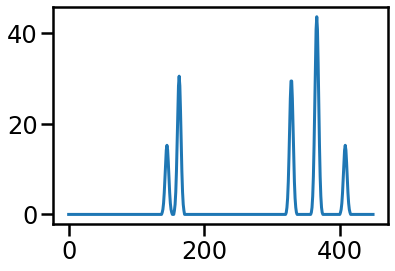

In [285]:
path_cell = os.getcwd() + '/HW_Data/pack_data_new/'
fname = 'Tabby_20190514_0.pickle'
print(fname[:-7])
#fname = 'Banner_20220315_1.pickle'

# all_high_trials = np.zeros((0,))
# all_cum_odor = np.zeros((0,))

cell_fname = path_cell + 'cell_' + fname

with open(cell_fname,'rb') as handle:
    cell_list = pickle.load(handle)
    ncells = len(cell_list)
    ntrials = len(cell_list[0]['spike_times'])
    #counts = 1000
    #test_cell = np.zeros((ncells, ntrials,counts)) 

    for i in range(1,2):
        cellid = cell_list[i]
        for trial in range(0,1):
            spike_times = cellid['spike_times'][trial]
            print(spike_times)
            plt.show()
            plt.plot(cellid['firing_rate'][trial])
            print(len(cellid['firing_rate'][trial]))
            #plt.xlim(135,155)

[-0.07 -0.06 -0.05 -0.04 -0.03 -0.02 -0.01  0.    0.01  0.02  0.03  0.04
  0.05  0.06  0.07]


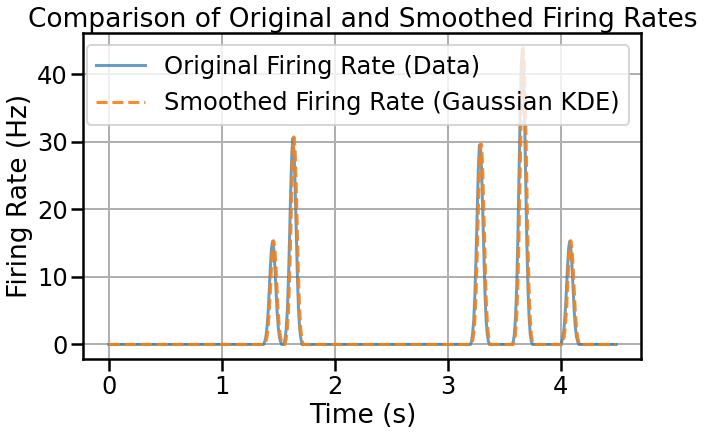

In [308]:
# Example spike times (in seconds)
sampling_rate = 30000
spike_times_sc = spike_times/sampling_rate

# Original data
firing_rate = cellid['firing_rate'][trial]  # Example data, replace with your actual firing_rate
bin_width = 0.01  # 10 ms bins
time = np.arange(0, len(firing_rate) * bin_width, bin_width)  # Time vector

# Parameters for the Gaussian kernel
sigma = 0.026  # Initial guess for kernel bandwidth (50 ms)
kernel_length = int(3*sigma/bin_width)  # Initial guess for the kernel span in bins
t = np.arange(-kernel_length * bin_width, kernel_length * bin_width, bin_width)
print(t)

# Generate Gaussian kernel
gaussian_kernel = np.exp(-0.5 * (t / sigma) ** 2) / (sigma * np.sqrt(2 * np.pi))
#gaussian_kernel *= 16 / np.max(gaussian_kernel)  # Normalize to match the desired peak rate
spike_train = np.zeros_like(time)
for spike in spike_times_sc:
    idx = np.searchsorted(time, spike)
    if idx < len(spike_train):
        spike_train[idx] +=1


# Convolve firing_rate with Gaussian kernel
reconstructed_firing_rate = np.convolve(spike_train, gaussian_kernel, mode='same')

# Plot both original and smoothed data
plt.figure(figsize=(10, 6))
plt.plot(time, firing_rate, label="Original Firing Rate (Data)", alpha=0.7)
plt.plot(time, reconstructed_firing_rate, label="Smoothed Firing Rate (Gaussian KDE)", linestyle="--", alpha=0.9)
plt.xlabel("Time (s)")
plt.ylabel("Firing Rate (Hz)")
plt.title("Comparison of Original and Smoothed Firing Rates")
plt.legend()
plt.grid(True)
#plt.xlim(1.55,1.85)
plt.show()

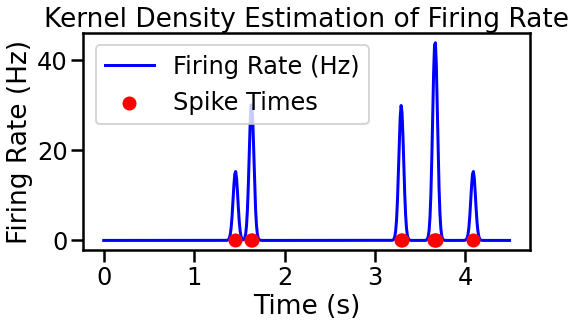

In [309]:
def gaussian_kernel(t, spike_times, sigma):
    """Gaussian kernel for firing rate estimation."""
    return np.sum(np.exp(-0.5 * ((t - spike_times) / sigma) ** 2) / (sigma * np.sqrt(2 * np.pi)))

# Example spike times (in seconds)
sampling_rate = 30000
spike_times_sc = spike_times/sampling_rate

# Parameters
t_min, t_max, dt = 0, 4.5, 0.01  # Time range and resolution
sigma = 0.026  # Kernel bandwidth (50 ms)
t = np.arange(t_min, t_max, dt)  # Time points for estimation

# Compute the firing rate
firing_rate = np.array([gaussian_kernel(ti, spike_times_sc, sigma) for ti in t])
firing_rate *= 1  # Convert to Hz if dt is in seconds

# Plotting
plt.figure(figsize=(8, 4))
plt.plot(t, firing_rate, label="Firing Rate (Hz)", color="blue")
plt.scatter(spike_times_sc, np.zeros_like(spike_times_sc), color="red", label="Spike Times", zorder=3)
plt.xlabel("Time (s)")
plt.ylabel("Firing Rate (Hz)")
plt.title("Kernel Density Estimation of Firing Rate")
#plt.ylim(0,0.0025)
plt.legend()
plt.show()

In [310]:
print(firing_rate.shape)

(450,)


In [253]:
#This is just for testing how ephys data can be loaded for a single data file

path_cell = os.getcwd() + '/HW_Data/pack_data_new/'
fname = 'Tabby_20190514_0.pickle'
print(fname[:-7])
#fname = 'Banner_20220315_1.pickle'

# all_high_trials = np.zeros((0,))
# all_cum_odor = np.zeros((0,))

cell_fname = path_cell + 'cell_' + fname

with open(cell_fname,'rb') as handle:
    cell_list = pickle.load(handle)
    #print(cell_list['Spike times'].shape)
    cell = cell_list[0]
    print(cell.keys())

    n_trials = cell['num_trials']
    print('cell n trials is', n_trials)
    print('number of cells is', len(cell_list))#_id))#.sum(1))

    cell_id = 13
    trial = 21

    firing_rate = cell['firing_rate']#[cell_id]
    spike_times = cell['spike_times']#[cell_id]

    print(n_trials, firing_rate.shape, spike_times.shape)
    
    #print('spike times are', spike_times)
    #print(len(spike_times[0]))

path_session = os.getcwd() + '/Session/'

session_fname = path_session + 'session_' + fname

# with open(session_fname,'rb') as handle:
#     session_list = pickle.load(handle)
#     session = session_list[0]
#     #print(session.keys())

#     num_trials = session['num_trials']
#     print('session n_trials is', num_trials)
#     trial_odor = session['trial_odor']
#     cum_odor = np.ceil(trial_odor.sum(axis=1)/5000)
#     #print('this is the cum number of pulses', cum_odor[0])

# path_codes = os.getcwd() + '/Bahareh/'

# num_trials = min(num_trials, n_trials)
# non_idle_trials = np.invert(session['idle_trials'])[:num_trials]
# print(np.argwhere(non_idle_trials==False))
# #spike_times = cell_list[1]['spike_times']
# #spike_times = spike_times[non_idle_trials]

# codes_fname = path_codes + fname[:-7] + '_data_all.npy'
# dat = np.load(codes_fname, allow_pickle=True)
# data = dat.tolist()
# odor = data['x'].astype(bool)
# odorx = data['x']
# number_of_trials = odor.shape[0]
# #print('codes n trials is', number_of_trials)
# #print(data['y_0'][-2][10:])#[0])

# codes = data['x_est_1']#+str(cell_id)]
# #print(data.keys())

# #print(list(cell['spike_times'][312]))

# if n_trials == number_of_trials:

#     total_trials = n_trials

# else:
#     total_trials = min(n_trials,number_of_trials)

# for i in range(total_trials):
#     print(i)

#     if len(list(cell['spike_times'][i])).size==0:
#         spikes = 0
        
#     print(data['y_0'][i].sum()) 
#     print(len(cell['spike_times'][i]))#.count())

# for item, i_trial in zip(cell['spike_times'], range(total_trials)):
#     #print(item, i_trial)
#     if isinstance(item, np.ndarray):  # Check if the item is a NumPy array
#         if item.size == 0:  # Check if the array is empty
#             spikes = 0
#             print("This subarray is empty")
#         elif item.size == 1:  # Check if the array contains a single element
#             print(f"This is a single-element array: {item}")
#             spikes = 1
#         else:
#             print(f"Subarray has elements: {item}")
#             spikes = len(item)
#     elif isinstance(item, list):  # Check if the item is a list
#         if len(item) == 0:
#             spikes = 0
#             print("This sublist is empty")
#         else:
#             spikes = len(item)
#             print(f"Sublist has elements: {item}")
#     else:
#         print(f"Unhandled type: {type(item)}")

#     print('total spikes from codes', data['y_0'][i_trial].sum())#.count())
#     print('total spikes from cell_',  spikes)
#     print(cum_odor[i_trial])
#     print(odor[i_trial].sum())
#     #print(data['x_est_11'])
#print(spike_times[334:])





Tabby_20190514_0
dict_keys(['year', 'month', 'day', 'session', 'cell_id', 'ks_id', 'full_delay_time', 'cut_delay_time', 'delay_time', 'sample_rate', 'num_trials', 'spike_times', 'firing_rate'])
cell n trials is 354
number of cells is 22


AttributeError: 'list' object has no attribute 'shape'

Tabby_20190514_0
session number of trials 354
cell n trials is 354
number of cells is 22
codes_num_trials 354
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
Shorthair_20190508_0
session number of trials 365
cell n trials is 365
number of cells is 2
codes_num_trials 365
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
Bengal_20190513_0
session number of trials 273
cell n trials is 273
number of cells is 30
codes_num_trials 273
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 2. 0. 0. 0. 2.

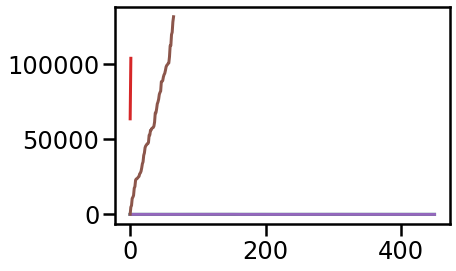

In [243]:
#Looping for getting all ephys data across data files

new_path = os.getcwd() + '/Bahareh/'
#good_neurons_dic = pickle.load(open("good_cells_BST.pickle", "rb",))
datax = str('_data_all.npy')


animal_list = [['Tabby'],['Shorthair'],['Bengal']]

session_id = 0
n_bins = 5 
s_fnames_list = []
    
for animals in animal_list:
    fname_list = list()
    for date_number in range(20190419,20190600):
        date_string = str(date_number)
        for animal in animals:
            fname = animal + '_' + date_string + '_' + str(session_id)+ '.pickle'
            #print(fname)
            cell_fname = new_path + 'cell_' + fname
            session_fname = new_path + 'session_' + fname
            if os.path.isfile(cell_fname) and os.path.isfile(session_fname):
                fname_list.append(fname[:-7])
              
    sorted_fname_list = sorted(fname_list, reverse=True)
    s_fnames_list.append(sorted_fname_list)
    list_of_sessions = len(sorted_fname_list)
    #print(list_of_sessions)
    
    for i_session in range(1):

        animal_name = sorted_fname_list[i_session]
        print(animal_name)
        session_fname = 'session_' + animal_name + '.pickle'
        cell_fname = 'cell_' + animal_name + '.pickle'
        #good_cells = good_neurons_dic[animal_name]
        # print(animal_name)
        # print(good_cells)
        
        dat = np.load(new_path+animal_name+datax, allow_pickle=True)
        data = dat.tolist()
        # codex = np.load(animal_name+cod)
        # kernel = np.load(animal_name+kern)
        # phaseweights = np.load(animal_name+phasew)
        
        session = pickle.load(open(new_path+session_fname,'rb'))[0]
        number_of_trials = session['num_trials']
        trial_odor = session['trial_odor'][0:5000]
        cum_odor = np.ceil(trial_odor.sum(axis=1)/5000)

        cell_list = pickle.load(open(new_path+cell_fname,'rb'))
        cell = cell_list[0]

        n_trials = cell['num_trials']
        print('session number of trials', number_of_trials)
        print('cell n trials is', n_trials)
        print('number of cells is', len(cell_list))#_id))#.sum(1))
        spike_times = cell['spike_times'][0]
        firing_rate = cell['firing_rate'][0]
        odor = data['x'].astype(bool)
        odorx = data['x']
        num_trials = odor.shape[0]
        print('codes_num_trials', num_trials)
        print(data['y_0'][0])

        plt.plot(firing_rate)
        plt.plot(spike_times)

        if number_of_trials != n_trials:
            plt.plot(session['trial_odor'][0])
            plt.show()
            plt.plot(odor[0])
            plt.show()

            plt.plot(session['trial_odor'][-2])
            plt.show()
            plt.plot(odor[-1])
            plt.show()

        

In [2]:
for pipi in range(20):
    print(pipi)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


In [240]:
animal_list = [['Tabby'],['Shorthair'],['Bengal']]
for animals in animal_list:
    print(animals[0])


Tabby
Shorthair
Bengal


In [206]:
#Flexible loop for compiling ephys data in a data frame. 

new_path = os.getcwd() + '/Bahareh/'
good_neurons_dic = pickle.load(open(new_path+"good_cells_BST.pickle", "rb",))
datax = str('_data_all.npy')

animal_list = [['Tabby'],['Shorthair'],['Bengal']]
session_id = 0
n_bins = 5 
results_list=list()

filenames_to_delete = ['Tabby_20190512_0', 'Shorthair_20190502_0', 'Bengal_20190430_0']
    
for animals in animal_list:
    fname_list = list()
    for date_number in range(20190419,20190600):
        date_string = str(date_number)
        for animal in animals:
            fname = animal + '_' + date_string + '_' + str(session_id)+ '.pickle'
            #print(fname)
            cell_fname = new_path + 'cell_' + fname
            session_fname = new_path + 'session_' + fname
            if os.path.isfile(cell_fname) and os.path.isfile(session_fname):
                fname_list.append(fname[:-7])
            
    for string in filenames_to_delete:
        if string in fname_list:
            fname_list.remove(string)

    sorted_fname_list = sorted(fname_list, reverse=True)
    list_of_sessions = len(sorted_fname_list)
    
    for i_session in range(list_of_sessions):

        animal_name = sorted_fname_list[i_session]
        print('session name', animal_name)
        session_fname = 'session_' + animal_name + '.pickle'
        cell_fname = 'cell_' + animal_name + '.pickle'
        #good_cells = good_neurons_dic[animal_name]
        dat = np.load(new_path+animal_name+datax, allow_pickle=True)
        data = dat.tolist()
         
        session = pickle.load(open(new_path+session_fname,'rb'))[0]
        cell_list = pickle.load(open(new_path+cell_fname,'rb'))
        compiled_cells, ncells = cell_compiler(cell_list)
        compiled_codes = code_compiler(data, cell_list)

        num_trials = min(session['num_trials'], cell_list[0]['num_trials'] )
        non_idle_trials = np.invert(session['idle_trials'])[:num_trials]
        correct_trials = session['correct_trials'][:num_trials][non_idle_trials]
        high_trials = session['high_trials'][:num_trials][non_idle_trials]
        low_trials = session['low_trials'][:num_trials][non_idle_trials]
        trial_odor = session['trial_odor'][:num_trials][non_idle_trials][0:5000]
        high_choices = (correct_trials==high_trials)
        # breathing_signal = np.append(session['trial_pre_breath'][:num_trials][non_idle_trials, -2500:],
        #                              session['trial_breath'][:num_trials][non_idle_trials, :6500], axis=1)
        
        cum_odor = np.ceil(trial_odor.sum(axis=1)/5000)
        non_idle_cell_data = compiled_cells[:,non_idle_trials,:]
        non_idle_codes = compiled_codes[:,non_idle_trials,:]
        #sniff_hist = get_sniff_histogram(session,False)[:num_trials][non_idle_trials]
        
        high_seven = cum_odor>8
        low_eight = cum_odor<=8
        bad_trials_1 = np.logical_and(high_seven,low_trials)
        bad_trials_2 = np.logical_and(low_eight,high_trials)
        bad_trials = np.logical_or(bad_trials_1,bad_trials_2)
        good_trials = np.invert(bad_trials)
        all_correct_trials = correct_trials[good_trials]
        all_high_trials = high_trials[good_trials]
        all_low_trials = low_trials[good_trials]
        all_high_choices = high_choices[good_trials]
        all_cum_odor = cum_odor[good_trials]
        # all_trial_odor = trial_odor[good_trials,:]
        # all_breathing = breathing_signal[good_trials,:]
        all_cell_data = non_idle_cell_data[:,good_trials,:]
        all_codes_data = non_idle_codes[:,good_trials,:]
        all_codes_data[all_codes_data == 0] = np.nan
        
        num_cells = ncells #kernel.shape[0] num_cells = len(good_cells)
        for trial in range(len(all_correct_trials)):
            for cell in range(num_cells):
                cell_id = cell # cell_id = good_cells[cell]
                spikes_list = []
                for value in all_cell_data[cell_id,trial,:]:
                    if not np.isnan(value):
                        spikes_list.append((int(value)+15000)/30000) 

                result_row_1 = {'Animal': animals[0],
                'Session': animal_name,
                'Date': animal_name[-10:-2],
                'Trial': trial,
                'Total Pulse': all_cum_odor[trial].astype(int),
                'High Trial': all_high_trials[trial].astype(int),
                'High Choice': all_high_choices[trial].astype(int),
                'Correct': all_correct_trials[trial].astype(int),
                #'Trial odor': all_trial_odor[trial].flatten().tolist(),
                #'Sniff histogram': all_sniff_hist[trial].flatten().tolist(),
                #'Breathing': all_breathing[trial].flatten().tolist(),
                'NCells': num_cells,
                'Cell': cell_id,                 
                'Spike times': spikes_list,
                'Codes': all_codes_data[cell_id, trial,:].flatten().tolist()}
                
                results_list.append(result_row_1)

df_all = pd.DataFrame(results_list)

                

session name Tabby_20190514_0
session name Tabby_20190513_0
session name Tabby_20190511_0
session name Tabby_20190510_0
session name Tabby_20190505_0
session name Tabby_20190504_0
session name Tabby_20190503_0
session name Tabby_20190501_0
session name Tabby_20190430_0
session name Tabby_20190427_0
session name Tabby_20190426_0
session name Tabby_20190423_0
session name Tabby_20190419_0
session name Shorthair_20190508_0
session name Shorthair_20190507_0
session name Shorthair_20190505_0
session name Shorthair_20190504_0
session name Shorthair_20190503_0
session name Shorthair_20190501_0
session name Shorthair_20190430_0
session name Shorthair_20190427_0
session name Shorthair_20190423_0
session name Shorthair_20190422_0
session name Shorthair_20190419_0
session name Bengal_20190513_0
session name Bengal_20190512_0
session name Bengal_20190511_0
session name Bengal_20190510_0
session name Bengal_20190509_0
session name Bengal_20190508_0
session name Bengal_20190507_0
session name Bengal

In [207]:
df_all

,Animal,Session,Date,Trial,Total Pulse,High Trial,High Choice,Correct,NCells,Cell,Spike times,Codes
0,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,22,0,[0.6437],"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
1,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,22,1,"[1.9574666666666667, 2.1328666666666667, 2.137...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
2,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,22,2,"[0.5084333333333333, 0.5182333333333333, 0.527...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
3,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,22,3,[1.2275],"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
4,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,22,4,[],"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
187939,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,13,8,"[0.6584333333333333, 0.7003666666666667, 0.710...","[nan, nan, nan, 3.00762939453125, nan, nan, na..."
187940,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,13,9,"[0.7590333333333333, 1.1868666666666667, 1.470...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
187941,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,13,10,"[2.2700666666666667, 3.8309, 3.8561666666666667]","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
187942,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,13,11,"[0.501, 0.5212, 0.5597333333333333, 0.74036666...","[nan, nan, nan, 1.2648662328720093, nan, nan, ..."


In [165]:
test_df

,Animal,Session,Date,Trial,Total Pulse,High Trial,High Choice,Correct,NCells,Spike times,Total_spike_count
0,Bengal,Bengal_20190419_0,20190419,0,5,0,1,0,13,"[0.5226333333333333, 0.5642333333333334, 0.809...",697
1,Bengal,Bengal_20190419_0,20190419,1,7,0,0,1,13,"[0.6528666666666667, 0.7066, 0.744733333333333...",478
2,Bengal,Bengal_20190419_0,20190419,2,3,0,0,1,13,"[0.8579666666666667, 1.1130666666666666, 1.367...",397
3,Bengal,Bengal_20190419_0,20190419,3,5,0,0,1,13,"[0.5888666666666666, 0.7111333333333333, 0.775...",359
4,Bengal,Bengal_20190419_0,20190419,4,16,1,1,1,13,"[0.5882333333333334, 0.6176666666666667, 0.635...",403
...,...,...,...,...,...,...,...,...,...,...,...
10997,Tabby,Tabby_20190514_0,20190514,331,4,0,0,1,22,"[2.9827333333333335, 3.3472, 3.358866666666666...",1099
10998,Tabby,Tabby_20190514_0,20190514,332,4,0,0,1,22,"[3.3151333333333333, 3.3264, 4.2523, 4.6478666...",909
10999,Tabby,Tabby_20190514_0,20190514,333,11,1,0,0,22,"[0.9929, 1.8842, 2.636, 4.705866666666667, 4.8...",1051
11000,Tabby,Tabby_20190514_0,20190514,334,16,1,1,1,22,"[1.2456666666666667, 3.4211, 3.4334, 3.4423666...",1307


In [189]:
super_low_n_df

,Animal,Session,Date,Trial,Total Pulse,High Trial,High Choice,Correct,NCells,Spike times,Total_spike_count
8582,Tabby,Tabby_20190501_0,20190501,0,14,1,1,1,6,"[1.5472666666666666, 1.8381666666666667, 1.854...",497
8583,Tabby,Tabby_20190501_0,20190501,1,14,1,1,1,6,"[3.0869666666666666, 3.112966666666667, 3.6282...",332
8584,Tabby,Tabby_20190501_0,20190501,2,1,0,0,1,6,"[0.5071333333333333, 0.6170333333333333, 0.774...",253
8585,Tabby,Tabby_20190501_0,20190501,3,3,0,0,1,6,"[0.5359333333333334, 0.5723666666666667, 0.686...",243
8586,Tabby,Tabby_20190501_0,20190501,4,4,0,0,1,6,"[1.1324, 1.2389, 1.2757, 1.6859333333333333, 2...",244
...,...,...,...,...,...,...,...,...,...,...,...
8916,Tabby,Tabby_20190501_0,20190501,334,11,1,0,0,6,"[0.7578666666666667, 0.7856666666666666, 0.840...",240
8917,Tabby,Tabby_20190501_0,20190501,335,5,0,0,1,6,"[2.0820333333333334, 1.3151666666666666, 3.400...",135
8918,Tabby,Tabby_20190501_0,20190501,336,14,1,0,0,6,"[1.2189666666666668, 1.3066, 1.3415, 1.4451333...",222
8919,Tabby,Tabby_20190501_0,20190501,337,5,0,0,1,6,"[2.5758666666666667, 0.6376666666666667, 0.642...",282


673


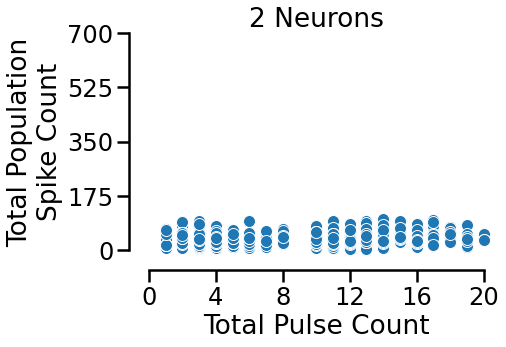

300


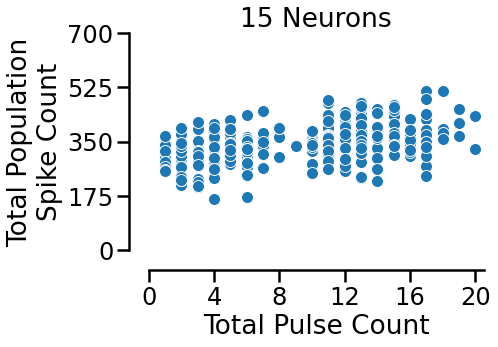

222


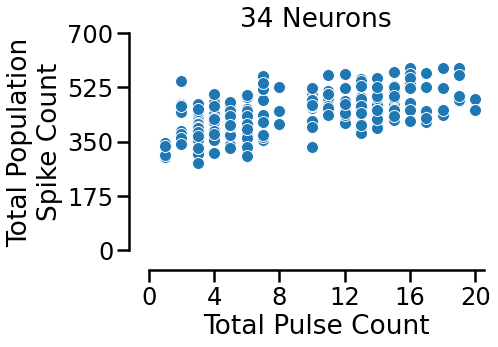

210


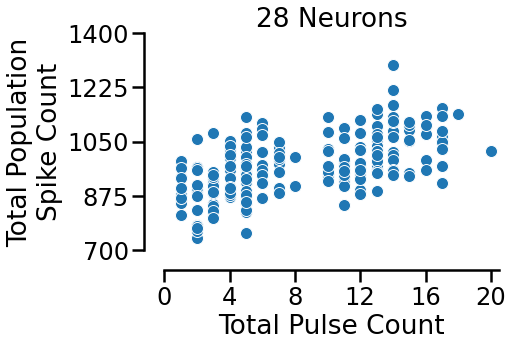

In [204]:
test_df = df_all.groupby(list(df_all.columns[:9]), as_index=False).agg({'Spike times': lambda x: sum(x, [])})
test_df['Total_spike_count'] = test_df['Spike times'].apply(lambda x: len(x))

n_neurons = 2
super_low_n_df = test_df.loc[(test_df['NCells']==n_neurons)]# & (test_df['Date']=='20190423')]
print(len(super_low_n_df))
sns.scatterplot(data=super_low_n_df.loc[super_low_n_df['Total Pulse']<21], x='Total Pulse', y='Total_spike_count', clip_on=False)
plt.ylim(0, 700)
plt.xlim(0,20)
plt.xticks([0,4,8,12,16,20])

plt.ylabel('Total Population\nSpike Count')
plt.xlabel('Total Pulse Count')
plt.yticks(np.arange(0,701,175))
plt.title(str(n_neurons)+' Neurons')
sns.despine(offset=20)
plt.savefig('pop_spike_counts_'+str(n_neurons)+'_neurons.svg', format='svg', bbox_inches='tight')
plt.show()

low_n_df = test_df.loc[test_df['NCells']==15]
print(len(low_n_df))
sns.scatterplot(data=low_n_df, x='Total Pulse', y='Total_spike_count', clip_on=True)
plt.ylim(0, 700)
plt.xlim(0,20.5)
plt.ylabel('Total Population\nSpike Count')
plt.xlabel('Total Pulse Count')
plt.xticks(np.arange(0,21,4))
plt.yticks(np.arange(0,701,175))
plt.title('15 Neurons')
sns.despine(offset=20)
plt.savefig('pop_spike_counts_15_neurons.svg', format='svg', bbox_inches='tight')
plt.show()

#low_n_df_array = , 'Total Pulse', 'Total_spike_count']].to_numpy()

high_n_df = test_df.loc[test_df['NCells']==34]
print(len(high_n_df))
sns.scatterplot(data=high_n_df, x='Total Pulse', y='Total_spike_count')
plt.ylim(0, 700)
plt.xlim(0,20.5)
plt.ylabel('Total Population\nSpike Count')
plt.xlabel('Total Pulse Count')
plt.xticks(np.arange(0,21,4))
plt.yticks(np.arange(0,701,175))
plt.title('34 Neurons')
sns.despine(offset=20)
plt.savefig('pop_spike_counts_34_neurons.svg', format='svg', bbox_inches='tight')
plt.show()

high_n_df_alt = test_df.loc[(test_df['NCells']==28) & (test_df['Date']=='20190504')]
print(len(high_n_df_alt))
sns.scatterplot(data=high_n_df_alt, x='Total Pulse', y='Total_spike_count')
plt.ylim(700, 1400)
plt.xlim(0,20.5)
plt.ylabel('Total Population\nSpike Count')
plt.xlabel('Total Pulse Count')
plt.xticks(np.arange(0,21,4))
plt.yticks(np.arange(700,1401,175))
plt.title('28 Neurons')
sns.despine(offset=20)
plt.savefig('pop_spike_counts_28_neurons.svg', format='svg', bbox_inches='tight')
plt.show()

data_dict = {'trials_15n': low_n_df['Trial'].to_numpy(),
            'total_pulse_15n': low_n_df['Total Pulse'].to_numpy(),
            'total_spike_15n': low_n_df['Total_spike_count'].to_numpy(),
            'trials_34n': high_n_df['Trial'].to_numpy(),
            'total_pulse_34n': high_n_df['Total Pulse'].to_numpy(),
            'total_spike_34n': high_n_df['Total_spike_count'].to_numpy(),
            'trials_28n': high_n_df_alt['Trial'].to_numpy(),
            'total_pulse_28n': high_n_df_alt['Total Pulse'].to_numpy(),
            'total_spike_28n': high_n_df_alt['Total_spike_count'].to_numpy(),
            'trials_2n': super_low_n_df['Trial'].to_numpy(),
            'total_pulse_2n': super_low_n_df['Total Pulse'].to_numpy(),
            'total_spike_2n': super_low_n_df['Total_spike_count'].to_numpy(),
        }

scipy.io.savemat('apcx_spike_counts.mat', data_dict)



plt.show()

In [170]:
low_n_df

,Animal,Session,Date,Trial,Total Pulse,High Trial,High Choice,Correct,NCells,Spike times,Total_spike_count
9766,Tabby,Tabby_20190511_0,20190511,0,13,1,0,0,15,"[1.6324, 1.8163, 1.8714, 1.9064333333333334, 2...",424
9767,Tabby,Tabby_20190511_0,20190511,1,3,0,0,1,15,"[0.9919, 1.0151666666666668, 1.077366666666666...",353
9768,Tabby,Tabby_20190511_0,20190511,2,13,1,1,1,15,"[1.0849, 1.1123, 1.4949666666666668, 1.5177333...",440
9769,Tabby,Tabby_20190511_0,20190511,3,2,0,0,1,15,"[0.5500666666666667, 0.7032666666666667, 1.051...",286
9770,Tabby,Tabby_20190511_0,20190511,4,11,1,1,1,15,"[0.5526, 0.611, 0.6757, 0.6832333333333334, 0....",395
...,...,...,...,...,...,...,...,...,...,...,...
10061,Tabby,Tabby_20190511_0,20190511,295,2,0,0,1,15,"[0.5071, 0.5377666666666666, 0.5533, 0.5901333...",344
10062,Tabby,Tabby_20190511_0,20190511,296,4,0,0,1,15,"[0.5278333333333334, 0.5412666666666667, 0.598...",263
10063,Tabby,Tabby_20190511_0,20190511,297,13,1,0,0,15,"[0.7916333333333333, 1.0952, 1.119633333333333...",236
10064,Tabby,Tabby_20190511_0,20190511,298,13,1,1,1,15,"[0.5277333333333334, 0.6175333333333334, 0.827...",329


In [4]:
def data_prep(df, nbins):
    df_2 = df.groupby(list(df.columns[:7]), as_index=False).agg({'Spike times': lambda x: sum(x, [])})
    edges = np.linspace(0.5,5,nbins+1)
    for i in range(len(edges[:-1])):
        lower_edge = edges[i]
        upper_edge = edges[i+1]
        new_col = 'Sbin_'+str(i+1)
        #df_prueba[new_col] = df_prueba['Spike times'].apply(lambda x: sum(i-1 < j < i for j in x))
        df_2[new_col] = df_2['Spike times'].apply(lambda x: sum(lower_edge < j < upper_edge for j in x))
    # df_prueba['Spike times'][0]
        
    df_2.rename(columns={'High Trial': 'High_trial','High Choice': 'High_choice'}, inplace=True)
    columns_to_scale = df_2.columns[-5:]
    
    scaler = StandardScaler()
    scaler.fit(df_2[columns_to_scale])
    scaled_columns = scaler.transform(df_2[columns_to_scale])
    df_2[columns_to_scale] = scaled_columns

    return df_2

new_df = data_prep(df_all, 5)


In [58]:
all_cell_stats = []

for session in df_all['Session'].unique():
    session_data = df_all[df_all['Session']==session]
    npulse = session_data['Total Pulse'].unique()
    for pulse in npulse:
        session_pulse = session_data[session_data['Total Pulse']==pulse]

        # Compute the mean and variance of the spike count for each cell
        session_pulse['Spike times'] = session_pulse['Spike times'].apply(len)
        
        # Group by 'Cell' to get the mean and variance of spike counts
        cell_stats = session_pulse.groupby('Cell')['Spike times'].agg(['mean', 'std']).reset_index()
        
        # Add 'Session' and 'Total Pulse' information to 'cell_stats'
        cell_stats['Session'] = session
        cell_stats['Total Pulse'] = pulse
        
        # Append the resulting DataFrame to the list
        all_cell_stats.append(cell_stats)

# Concatenate all the cell_stats DataFrames into a single DataFrame
final_cell_stats = pd.concat(all_cell_stats, ignore_index=True)

# Display the final DataFrame

final_cell_stats.head(50)


,Cell,mean,std,Session,Total Pulse
0,0,2.642857,2.541715,Tabby_20190514_0,3
1,1,8.428571,7.390828,Tabby_20190514_0,3
2,2,189.250000,41.158794,Tabby_20190514_0,3
3,3,6.107143,3.119108,Tabby_20190514_0,3
4,4,2.678571,3.103804,Tabby_20190514_0,3
5,5,2.464286,3.048766,Tabby_20190514_0,3
6,6,25.321429,9.388936,Tabby_20190514_0,3
7,7,108.500000,23.397531,Tabby_20190514_0,3
8,8,87.500000,16.419275,Tabby_20190514_0,3
9,9,69.321429,17.699244,Tabby_20190514_0,3


In [63]:
all_cell_regression = []

for session in final_cell_stats['Session'].unique():
    final_session_data = final_cell_stats[final_cell_stats['Session']==session]
    nucells = final_session_data['Cell'].unique()
    for cell in nucells:
        final_session_cell = final_session_data[final_session_data['Cell']==cell]

        # Compute the mean and variance of the spike count for each cell
        X = final_session_cell['Total Pulse'].values
        
        y_mean = final_session_cell['mean'].values
        y_std = final_session_cell['std'].values

        # Create a mask for non-NaN values in y
        mask = ~np.isnan(y_std)

        # Filter x and y using the mask
        x_filtered = X[mask]
        y_filtered = y_std[mask]

        slope_m, intercept_m, r_value_m, p_value_m, std_err_m = linregress(X,y_mean)
        slope_std, intercept_std, r_value_std, p_value_std, std_err_std = linregress(x_filtered,y_filtered)
        
        result_row_n ={
                'Session': session,
                'Cell': cell,
                'Slope_mean': slope_m,
                'R2_mean': r_value_m,
                'p_value_m': p_value_m,
                'std_err_m': std_err_m,
                'Slope_std': slope_std,
                'R2_std': r_value_std,
                'p_value_std': p_value_std,
                'std_err_std': std_err_std}
        
        all_cell_regression.append(result_row_n)

regression_df = pd.DataFrame(all_cell_regression)

regression_df

,Session,Cell,Slope_mean,R2_mean,p_value_m,std_err_m,Slope_std,R2_std,p_value_std,std_err_std
0,Tabby_20190514_0,0,0.097150,0.272908,2.191384e-01,0.076578,0.008578,0.056128,0.819470,0.037009
1,Tabby_20190514_0,1,2.433977,0.866990,1.786190e-07,0.312824,0.600289,0.721106,0.000494,0.139881
2,Tabby_20190514_0,2,3.865107,0.874880,1.002687e-07,0.478462,-0.323929,-0.285982,0.235256,0.263245
3,Tabby_20190514_0,3,-0.144896,-0.576164,5.009764e-03,0.045961,-0.060103,-0.494965,0.031193,0.025590
4,Tabby_20190514_0,4,-0.136278,-0.689710,3.832035e-04,0.031992,-0.168894,-0.724269,0.000454,0.038997
...,...,...,...,...,...,...,...,...,...,...
823,Bengal_20190419_0,8,0.477022,0.348783,1.433258e-01,0.310880,0.100287,0.111610,0.659279,0.223233
824,Bengal_20190419_0,9,-0.079790,-0.274077,2.561734e-01,0.067904,-0.060195,-0.312186,0.207230,0.045795
825,Bengal_20190419_0,10,-0.055924,-0.194874,4.240144e-01,0.068268,-0.022094,-0.097364,0.700725,0.056460
826,Bengal_20190419_0,11,0.784500,0.843532,5.701730e-06,0.121145,-0.226999,-0.411564,0.089711,0.125669


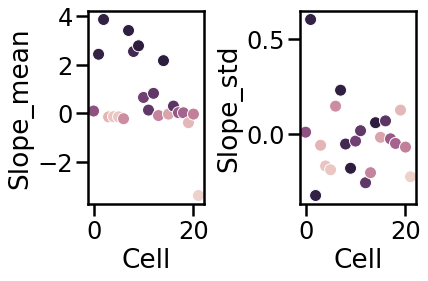

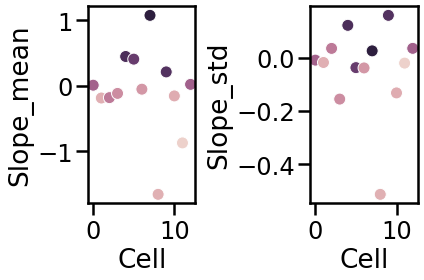

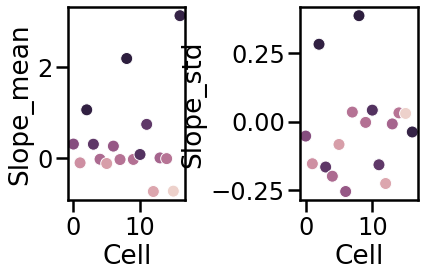

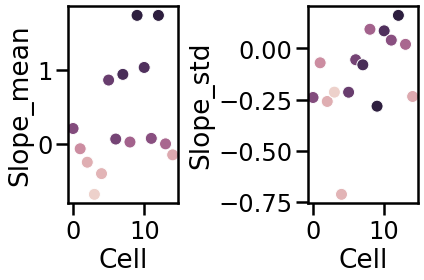

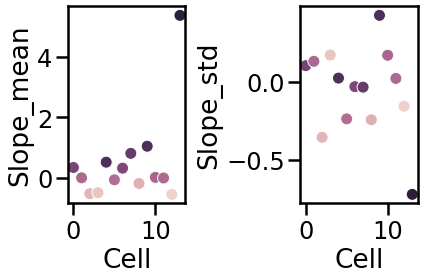

...

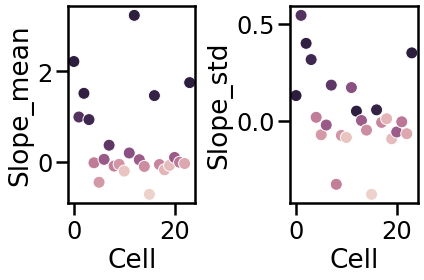

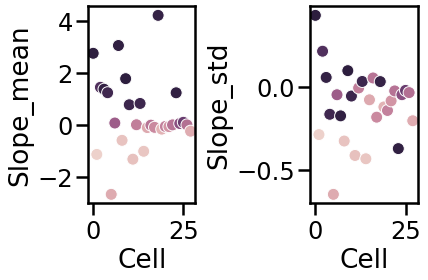

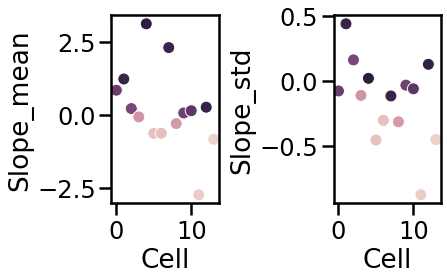

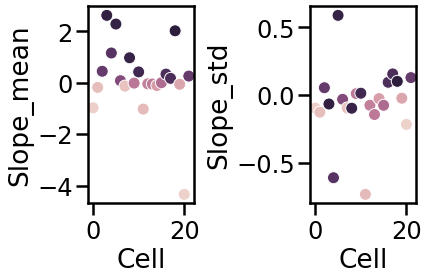

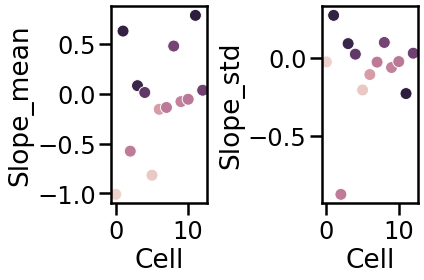

In [68]:
for session in regression_df['Session'].unique():
    session_df = regression_df[regression_df['Session']==session]
    plt.subplot(1,2,1)
    sns.scatterplot(data=session_df, x='Cell', y='Slope_mean', hue='R2_mean', legend=False)
    plt.subplot(1,2,2)
    sns.scatterplot(data=session_df, x='Cell', y='Slope_std', hue='R2_mean', legend=False)
    plt.tight_layout()
    plt.show()

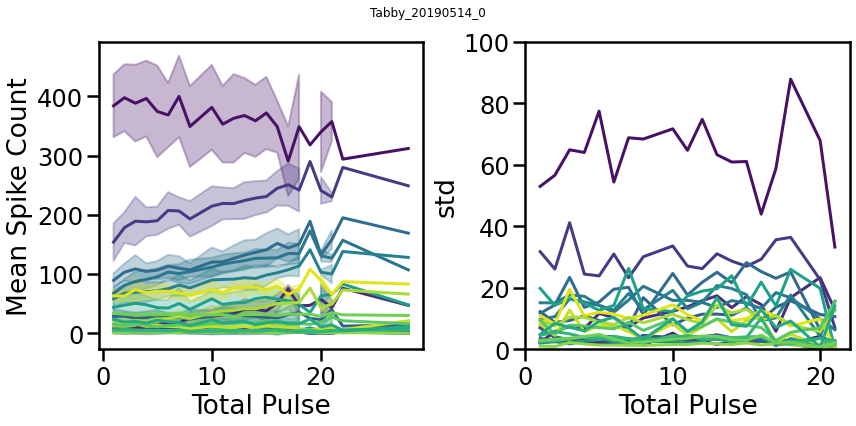

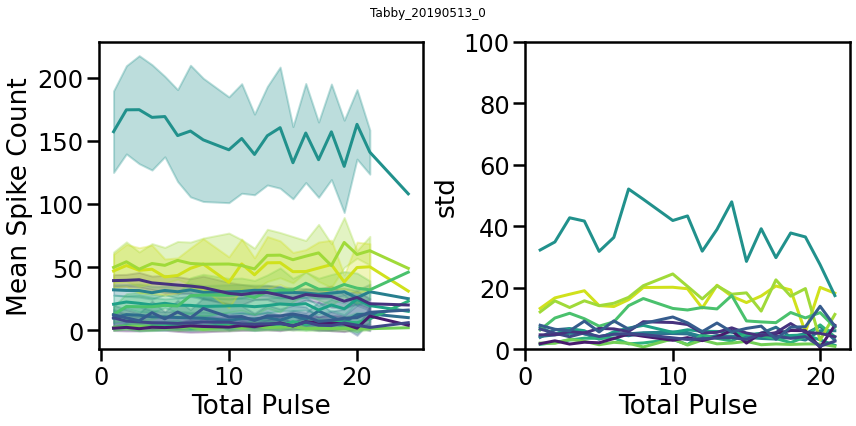

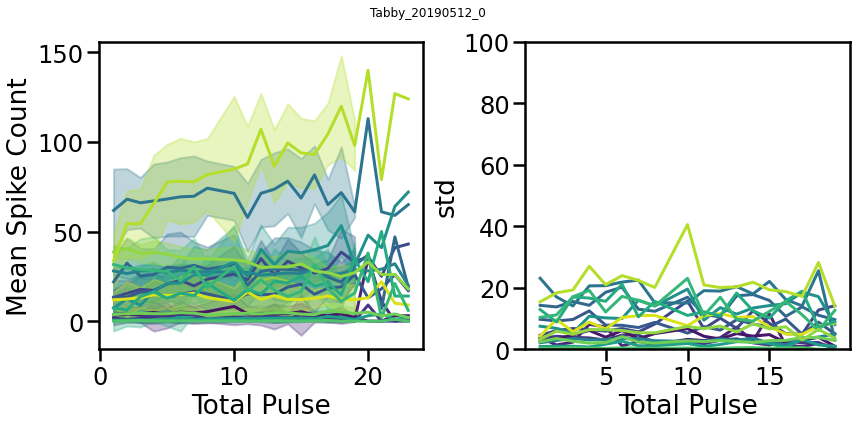

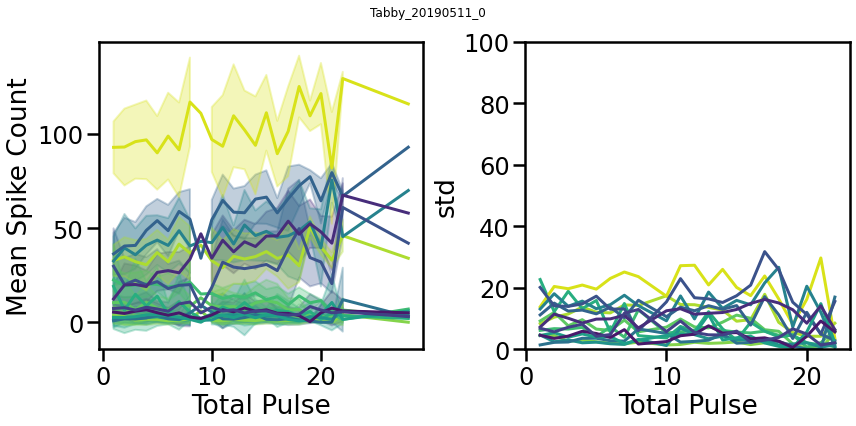

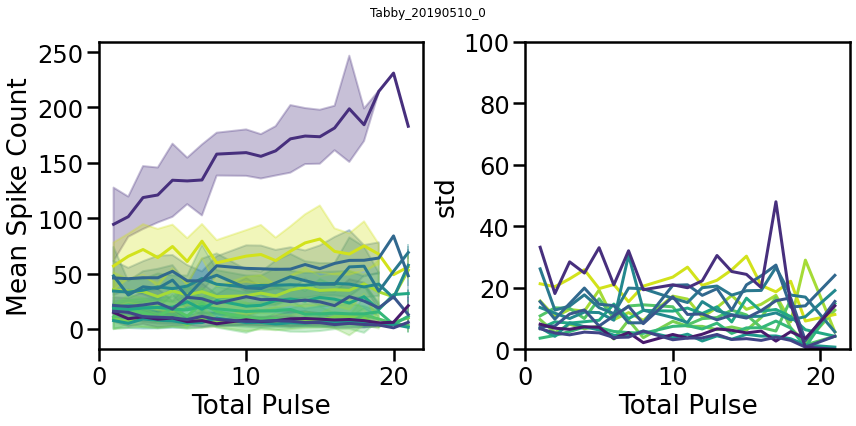

...

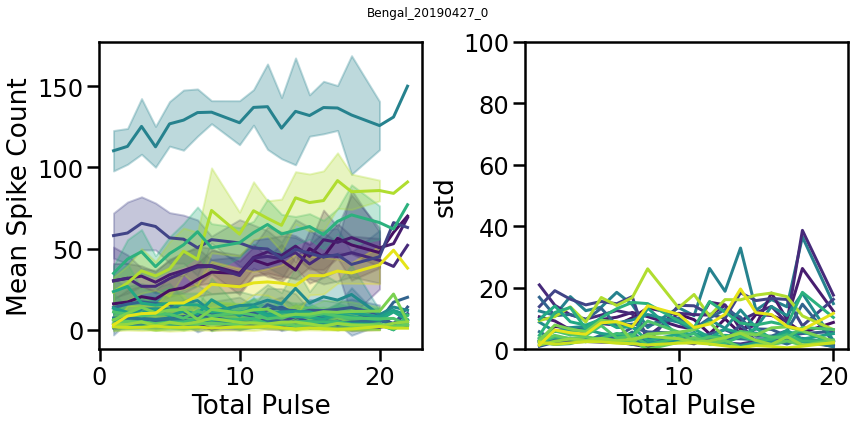

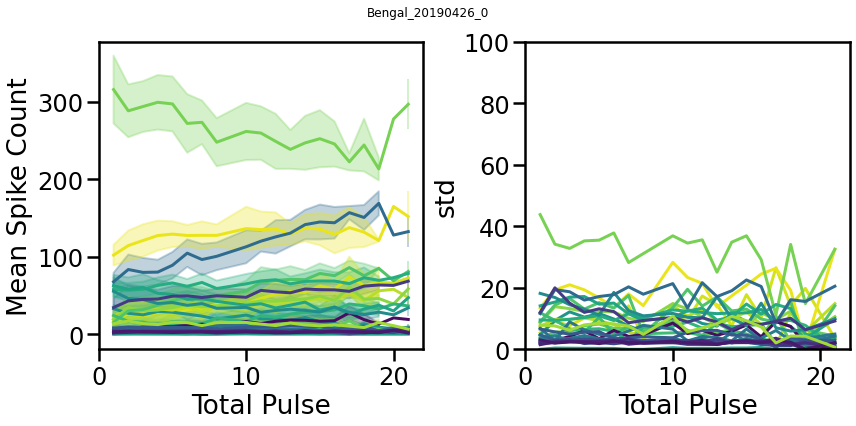

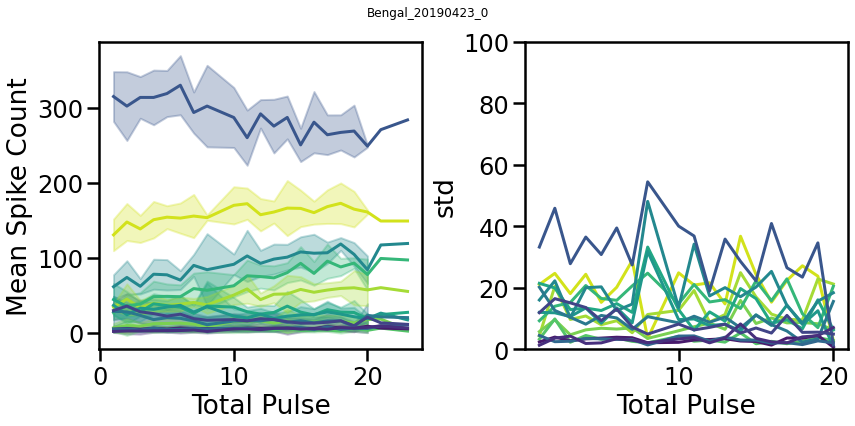

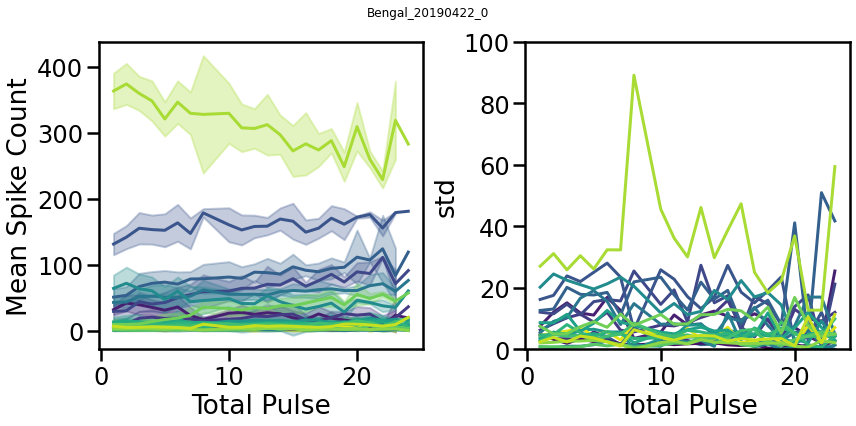

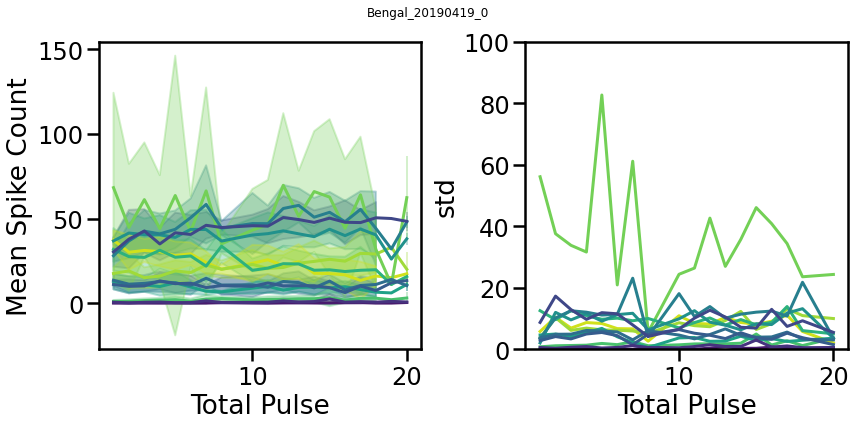

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

# Iterate through each session and create a plot for each
for session in final_cell_stats['Session'].unique():
    # Filter data for the current session
    session_data = final_cell_stats[final_cell_stats['Session'] == session]
    sorted_df = session_data.sort_values(by='Total Pulse', ascending=True)

    # Create a color palette and map it to the cells
    unique_cells = sorted_df['Cell'].unique()
    palette = sns.color_palette("viridis", len(unique_cells))
    color_mapping = dict(zip(unique_cells, palette))

    # Create a figure for the current session
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)

    # Create the line plot for 'mean' vs 'Total Pulse' with 'Cell' as hue
    sns.lineplot(
        data=sorted_df,
        x='Total Pulse',
        y='mean',
        hue='Cell',
        palette=color_mapping,  # Use the predefined color mapping
        markers=True,
        err_style="bars",
        legend=False,
        ci=None  # We will use custom error bars with 'var'
    )

    # Add error bars manually using the 'var' column as standard deviation (sqrt(var))
    for cell in unique_cells:
        cell_data = sorted_df[sorted_df['Cell'] == cell]
        
        plt.fill_between(
            cell_data['Total Pulse'],
            cell_data['mean'] - cell_data['std'],
            cell_data['mean'] + cell_data['std'],
            color=color_mapping[cell],  # Use the same color for the fill
            alpha=0.3  # Transparency for better visibility
        )

    # Set plot labels and title
    plt.xlabel('Total Pulse')
    plt.ylabel('Mean Spike Count')

    plt.subplot(1, 2, 2)

    # Create the line plot for 'std' vs 'Total Pulse' with 'Cell' as hue
    sns.lineplot(
        data=sorted_df,
        x='Total Pulse',
        y='std',
        hue='Cell',
        palette=color_mapping,  # Use the predefined color mapping
        markers=True,
        err_style="bars",
        legend=False,
        ci=None
    )

    plt.ylim(0,100)

    plt.suptitle(f'{session}')
    plt.tight_layout()

    # Show the plot for the current session
    plt.show()



In [50]:
sorted_df[sorted_df['Cell']==8]

,Cell,mean,std,Session,Total Pulse
16997,8,28.000000,3.559026,Bengal_20190419_0,1
16945,8,36.764706,10.201283,Bengal_20190419_0,2
16802,8,42.521739,12.540370,Bengal_20190419_0,3
16893,8,40.911765,12.061377,Bengal_20190419_0,4
16776,8,43.608696,11.130381,Bengal_20190419_0,5
16932,8,50.500000,11.379807,Bengal_20190419_0,6
16789,8,58.333333,23.105555,Bengal_20190419_0,7
16984,8,44.333333,4.163332,Bengal_20190419_0,8
16919,8,47.000000,18.096040,Bengal_20190419_0,10
16841,8,46.947368,10.663925,Bengal_20190419_0,11


In [51]:
logreg = LogisticRegression()
accuracies = []

# Iterate over each subject and session
for subject in new_df['Animal'].unique():
    for session in new_df[new_df['Animal'] == subject]['Session'].unique():
        print(session)
        session_data = new_df[(new_df['Animal'] == subject) & (new_df['Session'] == session)]
        
for spike_bin in new_df.columns[6:]: #new_df.columns[-5:]
            print(spike_bin)
            X = session_data[spike_bin].values.reshape(-1, 1)
            y = session_data['High_choice'].values

            # StratifiedKFold to ensure balanced class distribution
            skf = StratifiedKFold(n_splits=5)

            # Perform permutation test score
            score, permutation_scores, p_value = permutation_test_score(
                logreg, X, y, cv=skf, n_permutations=1000, scoring="accuracy", n_jobs=-1
            )
            # Store the real accuracy and p-value
            accuracies.append({
                'subject': subject,
                'session': session,
                'time_window': spike_bin,
                'real_accuracy': score,
                'perm_accuracy': np.median(permutation_scores),
                'p_value': p_value
            })

# Convert results to DataFrame for comparison
accuracy_df = pd.DataFrame(accuracies)

Bengal_20190419_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190422_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190423_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190426_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190427_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190430_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190501_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190502_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190503_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190504_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190505_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190507_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190508_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190509_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190510_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190511_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190512_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Bengal_20190513_0
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Shorthair_20190419_0
Sbin_1
Sbin_2
Sbin_3
Sbin

In [364]:
def  melt_and_test(df, col_name, subject_factor):
    col_name = str(col_name)
    pg_accuracy_df = pd.melt(df, id_vars=['subject','session', col_name],
                         value_vars = ['real_accuracy', 'perm_accuracy'],
                         var_name = 'bin_type', value_name='accuracy')
    
    rm_anova = pg.rm_anova(dv='accuracy', within=['time_window', 'bin_type'], subject=subject_factor, 
                           data=pg_accuracy_df, detailed=True)
    
    post_hoc = pg.pairwise_ttests(dv='accuracy', within='time_window', between='bin_type', subject=subject_factor, 
                              data=pg_accuracy_df, padjust='bonf',  # Bonferroni correction for multiple comparisons
                              within_first=True, effsize='hedges', # Hedge's g effect size
                              return_desc=True) # Return descriptive stats as well
    
    return pg_accuracy_df, rm_anova, post_hoc

    


,Contrast,time_window,A,B,mean(A),std(A),mean(B),std(B),Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,time_window,-,Sbin_1,Sbin_2,0.587522,0.037519,0.589267,0.043937,True,True,-0.547406,42.0,two-sided,0.586997,1.000000,bonf,0.19,-0.042326
1,time_window,-,Sbin_1,Sbin_3,0.587522,0.037519,0.586727,0.041810,True,True,0.210153,42.0,two-sided,0.834565,1.000000,bonf,0.168,0.019838
2,time_window,-,Sbin_1,Sbin_4,0.587522,0.037519,0.590065,0.043862,True,True,-0.578461,42.0,two-sided,0.566042,1.000000,bonf,0.193,-0.061746
3,time_window,-,Sbin_1,Sbin_5,0.587522,0.037519,0.584267,0.040381,True,True,0.746561,42.0,two-sided,0.459487,1.000000,bonf,0.214,0.082784
4,time_window,-,Sbin_2,Sbin_3,0.589267,0.043937,0.586727,0.041810,True,True,0.903486,42.0,two-sided,0.371421,1.000000,bonf,0.242,0.058694
5,time_window,-,Sbin_2,Sbin_4,0.589267,0.043937,0.590065,0.043862,True,True,-0.226572,42.0,two-sided,0.821855,1.000000,bonf,0.169,-0.018016
6,time_window,-,Sbin_2,Sbin_5,0.589267,0.043937,0.584267,0.040381,True,True,1.252649,42.0,two-sided,0.217264,1.000000,bonf,0.342,0.117446
7,time_window,-,Sbin_3,Sbin_4,0.586727,0.041810,0.590065,0.043862,True,True,-1.316116,42.0,two-sided,0.195273,1.000000,bonf,0.368,-0.077205
8,time_window,-,Sbin_3,Sbin_5,0.586727,0.041810,0.584267,0.040381,True,True,0.852068,42.0,two-sided,0.399009,1.000000,bonf,0.232,0.059330
9,time_window,-,Sbin_4,Sbin_5,0.590065,0.043862,0.584267,0.040381,True,True,2.449731,42.0,two-sided,0.018547,0.185471,bonf,2.352,0.136316


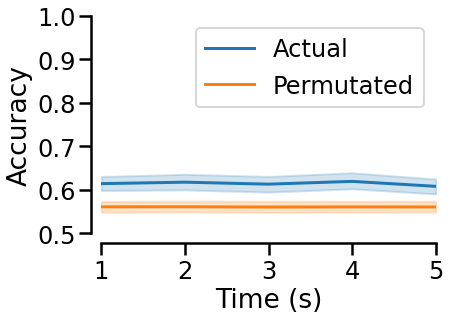

In [392]:
sns.lineplot(x='time_window', y='real_accuracy', data=accuracy_df, palette='rocket', 
             err_style='band', errorbar='ci', label='Actual')
sns.lineplot(x='time_window', y='perm_accuracy', data=accuracy_df, palette='rocket_r', 
             err_style='band', errorbar='ci', label='Permutated')

plt.ylabel('Accuracy')
plt.xlabel('Time (s)')
plt.xticks(np.arange(0,5), np.arange(1,6))
plt.yticks(np.arange(0.5,1.05,0.1))#, np.arange(0.5,1,6))
plt.ylim(0.5,1)
plt.xlim(0,4)
#plt.legend(['Actual','', 'Permutated',''])

sns.despine(offset=10)
melt_and_test(accuracy_df, 'time_window', 'session')[2]


Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5
Sbin_1
Sbin_2
Sbin_3
Sbin_4
Sbin_5


<AxesSubplot:xlabel='time_window', ylabel='real_accuracy'>

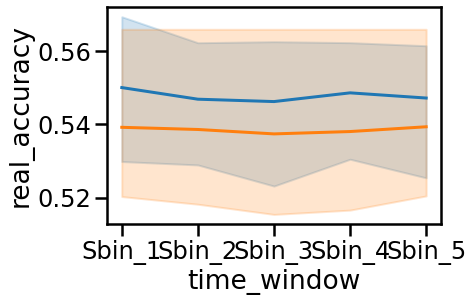

In [64]:
model = LogisticRegression()
accuracies_as = []

# Iterate over each subject
for subject in new_df['Animal'].unique():
    # Filter data for the current subject
    subject_data = new_df[new_df['Animal'] == subject]
    
    for spike_bin in new_df.columns[8:]:
        print(spike_bin)
        X = subject_data[spike_bin].values.reshape(-1, 1)  # Features (spikes)
        y = subject_data['High_choice'].values                    # Targets (binary choice)
        groups = subject_data['Session'].values              # Session IDs (for grouping)
        
        # GroupKFold ensures splitting based on sessions
        gkf = GroupKFold(n_splits=5)

        # Perform permutation test score with cross-validation across sessions
        score, permutation_scores, p_value = permutation_test_score(
            model, X, y, groups=groups, cv=gkf, n_permutations=1000, scoring="accuracy", n_jobs=-1)
        
        # Store the real accuracy and p-value
        accuracies_as.append({
                'subject': subject,
                'session': session,
                'time_window': spike_bin,
                'real_accuracy': score,
                'perm_accuracy': np.median(permutation_scores),
                'p_value': p_value
            })


# Convert results to DataFrame for easy comparison
accuracy_df_across_sessions = pd.DataFrame(accuracies_as)

In [370]:
accuracy_df_across_sessions

,subject,session,time_window,real_accuracy,perm_accuracy,p_value
0,Bengal,Tabby_20190514_0,Sbin_1,0.550877,0.531333,0.000999
1,Bengal,Tabby_20190514_0,Sbin_2,0.549385,0.531649,0.000999
2,Bengal,Tabby_20190514_0,Sbin_3,0.552920,0.530817,0.000999
3,Bengal,Tabby_20190514_0,Sbin_4,0.553001,0.531563,0.000999
4,Bengal,Tabby_20190514_0,Sbin_5,0.554675,0.531595,0.000999
5,Shorthair,Tabby_20190514_0,Sbin_1,0.529850,0.520290,0.023976
6,Shorthair,Tabby_20190514_0,Sbin_2,0.528916,0.518200,0.018981
7,Shorthair,Tabby_20190514_0,Sbin_3,0.523156,0.515419,0.118881
8,Shorthair,Tabby_20190514_0,Sbin_4,0.530476,0.516593,0.003996
9,Shorthair,Tabby_20190514_0,Sbin_5,0.525398,0.520465,0.243756


,Contrast,time_window,A,B,mean(A),std(A),mean(B),std(B),Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,time_window,-,Sbin_1,Sbin_2,0.544605,0.021499,0.542723,0.020358,True,True,2.154469,2.0,two-sided,0.164013,1.0,bonf,1.214,0.071885
1,time_window,-,Sbin_1,Sbin_3,0.544605,0.021499,0.541797,0.022475,True,True,1.467445,2.0,two-sided,0.279954,1.0,bonf,0.856,0.102116
2,time_window,-,Sbin_1,Sbin_4,0.544605,0.021499,0.543307,0.020304,True,True,0.950629,2.0,two-sided,0.442127,1.0,bonf,0.643,0.049665
3,time_window,-,Sbin_1,Sbin_5,0.544605,0.021499,0.543250,0.020376,True,True,0.764566,2.0,two-sided,0.524422,1.0,bonf,0.583,0.051735
4,time_window,-,Sbin_2,Sbin_3,0.542723,0.020358,0.541797,0.022475,True,True,0.541964,2.0,two-sided,0.642151,1.0,bonf,0.527,0.034546
5,time_window,-,Sbin_2,Sbin_4,0.542723,0.020358,0.543307,0.020304,True,True,-0.987061,2.0,two-sided,0.427662,1.0,bonf,0.656,-0.022946
6,time_window,-,Sbin_2,Sbin_5,0.542723,0.020358,0.543250,0.020376,True,True,-0.502961,2.0,two-sided,0.664914,1.0,bonf,0.519,-0.020690
7,time_window,-,Sbin_3,Sbin_4,0.541797,0.022475,0.543307,0.020304,True,True,-1.095026,2.0,two-sided,0.387774,1.0,bonf,0.696,-0.056370
8,time_window,-,Sbin_3,Sbin_5,0.541797,0.022475,0.543250,0.020376,True,True,-1.195381,2.0,two-sided,0.354455,1.0,bonf,0.736,-0.054177
9,time_window,-,Sbin_4,Sbin_5,0.543307,0.020304,0.543250,0.020376,True,True,0.123196,2.0,two-sided,0.913216,1.0,bonf,0.47,0.002218


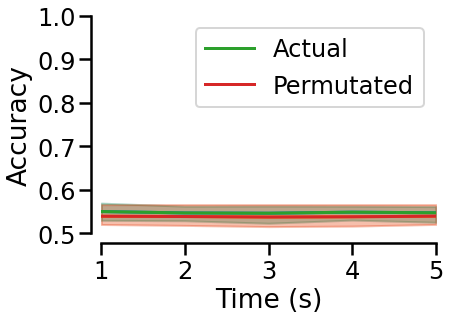

In [391]:
sns.lineplot(x='time_window', y='real_accuracy', data=accuracy_df_across_sessions, palette='rocket', err_style='band')
sns.lineplot(x='time_window', y='perm_accuracy', data=accuracy_df_across_sessions, palette='rocket_r', err_style='band')

sns.lineplot(x='time_window', y='real_accuracy', data=accuracy_df_across_sessions, palette='rocket', 
             err_style='band', errorbar='ci', label='Actual')
sns.lineplot(x='time_window', y='perm_accuracy', data=accuracy_df_across_sessions, palette='rocket_r', 
             err_style='band', errorbar='ci', label='Permutated')

plt.ylabel('Accuracy')
plt.xlabel('Time (s)')
plt.xticks(np.arange(0,5), np.arange(1,6))
plt.yticks(np.arange(0.5,1.05,0.1))#, np.arange(0.5,1,6))
plt.ylim(0.5,1)
plt.xlim(0,4)
#plt.legend(['Actual','', 'Permutated',''])

sns.despine(offset=10)
melt_and_test(accuracy_df_across_sessions, 'time_window', 'subject')[2]

In [372]:
logreg = LogisticRegression()
accuracies_cum = []

# Iterate over each subject and session
for subject in new_df['Animal'].unique():
    for session in new_df[new_df['Animal'] == subject]['Session'].unique():
        #print(session)
        session_data = new_df[(new_df['Animal'] == subject) & (new_df['Session'] == session)]

        spike_bins = list()
        for i in range(len(new_df.columns[8:])):
            spike_bins.append(new_df.columns[8:9+i])

        for spike_bin in spike_bins: #new_df.columns[-5:]
            #print(spike_bin)
            X = session_data[spike_bin].values
            y = session_data['High_choice'].values

            # StratifiedKFold to ensure balanced class distribution
            skf = StratifiedKFold(n_splits=5)

            # Perform permutation test score
            score, permutation_scores, p_value = permutation_test_score(
                logreg, X, y, cv=skf, n_permutations=1000, scoring="accuracy", n_jobs=-1
            )
            # Store the real accuracy and p-value
            accuracies_cum.append({
                'subject': subject,
                'session': session,
                'time_window': len(spike_bin),
                'real_accuracy': score,
                'perm_accuracy': np.median(permutation_scores),
                'p_value': p_value
            })

# Convert results to DataFrame for comparison
accuracy_df_cum = pd.DataFrame(accuracies_cum)


In [382]:
accuracy_df_cum['time_window'] = accuracy_df_cum['time_window'].astype(int)
accuracy_df_cum

,subject,session,time_window,real_accuracy,perm_accuracy,p_value
0,Bengal,Bengal_20190419_0,1,0.562857,0.566857,0.715285
1,Bengal,Bengal_20190419_0,2,0.554857,0.562857,0.793207
2,Bengal,Bengal_20190419_0,3,0.546612,0.562612,0.855145
3,Bengal,Bengal_20190419_0,4,0.566694,0.558694,0.264735
4,Bengal,Bengal_20190419_0,5,0.562449,0.554694,0.346653
...,...,...,...,...,...,...
210,Tabby,Tabby_20190514_0,1,0.666813,0.523793,0.000999
211,Tabby,Tabby_20190514_0,2,0.684636,0.517888,0.000999
212,Tabby,Tabby_20190514_0,3,0.726295,0.514947,0.000999
213,Tabby,Tabby_20190514_0,4,0.756146,0.512028,0.000999


,Contrast,time_window,A,B,mean(A),std(A),mean(B),std(B),Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,time_window,-,1,2,0.587522,0.037519,0.595456,0.043191,True,True,-3.228526,42.0,two-sided,2.416769e-03,2.416769e-02,bonf,13.657,-0.194353
1,time_window,-,1,3,0.587522,0.037519,0.599238,0.047919,True,True,-3.192736,42.0,two-sided,2.670216e-03,2.670216e-02,bonf,12.509,-0.269800
2,time_window,-,1,4,0.587522,0.037519,0.609731,0.046482,True,True,-5.514726,42.0,two-sided,1.974983e-06,1.974983e-05,bonf,8920.185,-0.521073
3,time_window,-,1,5,0.587522,0.037519,0.611556,0.047524,True,True,-5.459712,42.0,two-sided,2.367102e-06,2.367102e-05,bonf,7536.199,-0.556310
4,time_window,-,2,3,0.595456,0.043191,0.599238,0.047919,True,True,-1.710129,42.0,two-sided,9.462093e-02,9.462093e-01,bonf,0.629,-0.082167
5,time_window,-,2,4,0.595456,0.043191,0.609731,0.046482,True,True,-5.135142,42.0,two-sided,6.857373e-06,6.857373e-05,bonf,2806.991,-0.315315
6,time_window,-,2,5,0.595456,0.043191,0.611556,0.047524,True,True,-4.991436,42.0,two-sided,1.094572e-05,1.094572e-04,bonf,1821.103,-0.351379
7,time_window,-,3,4,0.599238,0.047919,0.609731,0.046482,True,True,-5.740547,42.0,two-sided,9.373934e-07,9.373934e-06,bonf,1.787e+04,-0.220290
8,time_window,-,3,5,0.599238,0.047919,0.611556,0.047524,True,True,-5.444470,42.0,two-sided,2.488821e-06,2.488821e-05,bonf,7192.652,-0.255810
9,time_window,-,4,5,0.609731,0.046482,0.611556,0.047524,True,True,-1.480039,42.0,two-sided,1.463255e-01,1.000000e+00,bonf,0.453,-0.038480


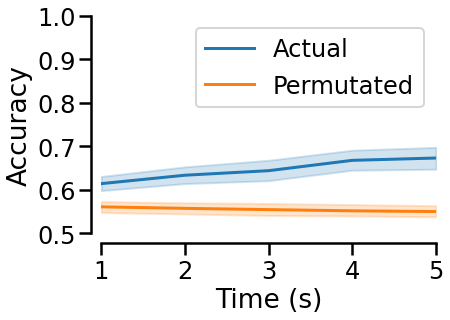

In [385]:
sns.lineplot(x='time_window', y='real_accuracy', data=accuracy_df_cum, palette='rocket', 
             err_style='band', errorbar='ci', label='Actual')
sns.lineplot(x='time_window', y='perm_accuracy', data=accuracy_df_cum, palette='rocket_r', 
             err_style='band', errorbar='ci', label='Permutated')

plt.ylabel('Accuracy')
plt.xlabel('Time (s)')
plt.xticks(np.arange(1,6), np.arange(1,6))
plt.yticks(np.arange(0.5,1.05,0.1))#, np.arange(0.5,1,6))
plt.ylim(0.5,1)
plt.xlim(1,5)
#plt.legend(['Actual','', 'Permutated',''])

sns.despine(offset=10)
df__, anova, posthoc = melt_and_test(accuracy_df_cum, 'time_window', 'session')

posthoc

Index(['Sbin_1'], dtype='object')
[[-0.28815001]
 [-0.43866255]
 [-0.34459221]
 ...
 [ 0.55848302]
 [ 1.12290504]
 [ 0.78425183]]
Index(['Sbin_1', 'Sbin_2'], dtype='object')
[[-0.28815001 -0.24163571]
 [-0.43866255 -0.24163571]
 [-0.34459221 -0.33848349]
 ...
 [ 0.55848302  0.88179857]
 [ 1.12290504  0.35882054]
 [ 0.78425183  1.15297236]]
Index(['Sbin_1', 'Sbin_2', 'Sbin_3'], dtype='object')
[[-0.28815001 -0.24163571 -0.37025151]
 [-0.43866255 -0.24163571 -0.17305374]
 [-0.34459221 -0.33848349 -0.11389441]
 ...
 [ 0.55848302  0.88179857  0.43825934]
 [ 1.12290504  0.35882054  0.85237465]
 [ 0.78425183  1.15297236  0.31994068]]
Index(['Sbin_1', 'Sbin_2', 'Sbin_3', 'Sbin_4'], dtype='object')
[[-0.28815001 -0.24163571 -0.37025151 -0.24324506]
 [-0.43866255 -0.24163571 -0.17305374 -0.48568801]
 [-0.34459221 -0.33848349 -0.11389441 -0.46548443]
 ...
 [ 0.55848302  0.88179857  0.43825934  0.44367665]
 [ 1.12290504  0.35882054  0.85237465  0.90835899]
 [ 0.78425183  1.15297236  0.31994068  0

<AxesSubplot:xlabel='time_window', ylabel='real_accuracy'>

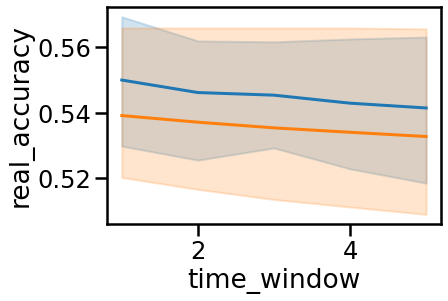

In [86]:
model = LogisticRegression()
accuracies_as_cum = []

# Iterate over each subject
for subject in new_df['Animal'].unique():
    # Filter data for the current subject
    subject_data = new_df[new_df['Animal'] == subject]
    
    spike_bins = list()
    for i in range(len(new_df.columns[8:])):
        spike_bins.append(new_df.columns[8:9+i])

    for spike_bin in spike_bins: #new_df.columns[-5:]
        print(spike_bin)
        X = subject_data[spike_bin].values
        print(X)  # Features (spikes)
        y = subject_data['High_choice'].values                    # Targets (binary choice)
        groups = subject_data['Session'].values              # Session IDs (for grouping)
        
        # GroupKFold ensures splitting based on sessions
        gkf = GroupKFold(n_splits=5)

        # Perform permutation test score with cross-validation across sessions
        score, permutation_scores, p_value = permutation_test_score(
            model, X, y, groups=groups, cv=gkf, n_permutations=1000, scoring="accuracy", n_jobs=-1)
        
        # Store the real accuracy and p-value
        accuracies_as_cum.append({
                'subject': subject,
                'session': session,
                'time_window': len(spike_bin),
                'real_accuracy': score,
                'perm_accuracy': np.median(permutation_scores),
                'p_value': p_value
            })


# Convert results to DataFrame for easy comparison
accuracy_df_as_cum = pd.DataFrame(accuracies_as_cum)


,Contrast,time_window,A,B,mean(A),std(A),mean(B),std(B),Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,time_window,-,1,2,0.544605,0.021499,0.541688,0.021466,True,True,3.220738,2.0,two-sided,0.084380,0.843801,bonf,1.857,0.108611
1,time_window,-,1,3,0.544605,0.021499,0.540424,0.021529,True,True,9.199037,2.0,two-sided,0.011612,0.116118,bonf,5.878,0.155465
2,time_window,-,1,4,0.544605,0.021499,0.538527,0.023866,True,True,4.402910,2.0,two-sided,0.047908,0.479080,bonf,2.623,0.214058
3,time_window,-,1,5,0.544605,0.021499,0.537149,0.025531,True,True,3.198949,2.0,two-sided,0.085390,0.853900,bonf,1.843,0.252738
4,time_window,-,2,3,0.541688,0.021466,0.540424,0.021529,True,True,0.929741,2.0,two-sided,0.450657,1.000000,bonf,0.636,0.047049
5,time_window,-,2,4,0.541688,0.021466,0.538527,0.023866,True,True,1.755969,2.0,two-sided,0.221177,1.000000,bonf,0.999,0.111409
6,time_window,-,2,5,0.541688,0.021466,0.537149,0.025531,True,True,1.814593,2.0,two-sided,0.211251,1.000000,bonf,1.029,0.153975
7,time_window,-,3,4,0.540424,0.021529,0.538527,0.023866,True,True,1.375811,2.0,two-sided,0.302692,1.000000,bonf,0.814,0.066760
8,time_window,-,3,5,0.540424,0.021529,0.537149,0.025531,True,True,1.369828,2.0,two-sided,0.304255,1.000000,bonf,0.811,0.110958
9,time_window,-,4,5,0.538527,0.023866,0.537149,0.025531,True,True,1.352183,2.0,two-sided,0.308922,1.000000,bonf,0.804,0.044632


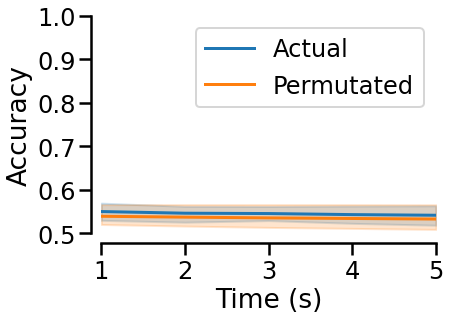

In [390]:
# sns.lineplot(x='time_window', y='real_accuracy', data=accuracy_df_as_cum, palette='rocket', err_style='band')
# sns.lineplot(x='time_window', y='perm_accuracy', data=accuracy_df_as_cum, palette='rocket_r', err_style='band')

sns.lineplot(x='time_window', y='real_accuracy', data=accuracy_df_as_cum, palette='rocket', 
             err_style='band', errorbar='ci', label='Actual')
sns.lineplot(x='time_window', y='perm_accuracy', data=accuracy_df_as_cum, palette='rocket_r', 
             err_style='band', errorbar='ci', label='Permutated')

plt.ylabel('Accuracy')
plt.xlabel('Time (s)')
plt.xticks(np.arange(1,6), np.arange(1,6))
plt.yticks(np.arange(0.5,1.05,0.1))#, np.arange(0.5,1,6))
plt.ylim(0.5,1)
plt.xlim(1,5)
#plt.legend(['Actual','', 'Permutated',''])

sns.despine(offset=10)
_, anova, posthoc = melt_and_test(accuracy_df_as_cum, 'time_window', 'subject')

posthoc

In [7]:
from sklearn.metrics import log_loss

In [25]:
# Initialize logistic regression model
model = LogisticRegression()

# List to store the results
output = []

# Iterate over each subject and session
for subject in new_df['Animal'].unique():
    for session in new_df[new_df['Animal'] == subject]['Session'].unique():
        session_data = new_df[(new_df['Animal'] == subject) & (new_df['Session'] == session)]
        
        dates = session_data['Date'].to_list()
        date = dates[0]
        
        # Combine all time bins (early, mid, late) into a single feature matrix
        X = session_data[new_df.columns[8:]].values  # Feature matrix
        #print(X)
        y = session_data['High_choice'].values  # Targets (binary choice)
        
        # Fit the model
        model.fit(X, y)

        #Number of parameters (including intercept)
        n_params = len(model.coef_.flatten()) + 1  # coefficients + intercept
        #Predicted probabilities for log-likelihood calculation
        y_pred_prob = model.predict_proba(X)
        #Calculate log-likelihood
        log_likelihood = -log_loss(y, y_pred_prob, normalize=False)
        #Compute AIC: 2k - 2 * log-likelihood
        aic = 2 * n_params - 2 * log_likelihood
        print(f"AIC: {aic}")
        
        # Store the coefficients for each time bin
        output.append({
            'Animal': subject,
            'Date': int(date),
            'Session': session,
            'Spikes_b0_coef': model.coef_[0][0],
            'Spikes_b1_coef': model.coef_[0][1],
            'Spikes_b2_coef': model.coef_[0][2],
            'Spikes_b3_coef': model.coef_[0][3],
            'Spikes_b4_coef': model.coef_[0][4],
            'intercept': model.intercept_[0]
        })

# Convert results to DataFrame for easy inspection
coefficients_df = pd.DataFrame(output)
spikes_df = coefficients_df
spikes_df['max_coef_spikes'] = np.abs(spikes_df[list(spikes_df.columns[3:8])]).max(axis=1)
for spike_bin in spikes_df.columns[3:8]:
    new_col = 'norm' + spike_bin
    # Relativize each coefficient by dividing it by the maximum coefficient of that session
    spikes_df[new_col] = spikes_df[spike_bin] / spikes_df['max_coef_spikes']

AIC: 345.65924675557824
AIC: 323.7396114349267
AIC: 269.11753778496177
AIC: 286.08061828882575
AIC: 219.13808016885417
AIC: 408.247078044546
AIC: 253.39741402008627
AIC: 221.54577757705755
AIC: 289.7008474767725
AIC: 252.05430711837045
AIC: 172.59535062868883
AIC: 124.46124106885476
AIC: 354.725771921122
AIC: 344.34478213347444
AIC: 355.6888336116682
AIC: 387.2123604340683
AIC: 317.5498346368684
AIC: 311.70019902765847
AIC: 290.8295342597156
AIC: 163.54107692683584
AIC: 227.61859728379446
AIC: 251.25007856611418
AIC: 294.74428214052307
AIC: 322.2189189983435
AIC: 481.5360017314648
AIC: 399.31186341906846
AIC: 200.7780376110382
AIC: 338.99088730963524
AIC: 487.6127721629042
AIC: 423.25338172722604
AIC: 226.40184443393804
AIC: 227.61836155643107
AIC: 320.37546819481895
AIC: 370.9319329353822
AIC: 373.9096283565749
AIC: 194.41952776068365
AIC: 144.52692475764044
AIC: 155.28212881809344
AIC: 282.8052380045681
AIC: 346.61057596731564
AIC: 346.36958707093913
AIC: 414.4640178690487
AIC: 342.7

In [26]:
behavioral_df = pd.read_pickle('behavioral_coefficients.pkl')
behavioral_df['Date'] = behavioral_df['Date'].astype(int)

df_joined = pd.merge(spikes_df, behavioral_df, how='inner', on=['Animal', 'Date', 'Session'], suffixes=('_left', '_right'))
df_joined

,Animal,Date,Session,Spikes_b0_coef,Spikes_b1_coef,Spikes_b2_coef,Spikes_b3_coef,Spikes_b4_coef,intercept,max_coef_spikes,...,real_accuracy_beh,perm_accuracy_beh,p_value_beh,aic,max_coef_beh,normPulses_b0_coef,normPulses_b1_coef,normPulses_b2_coef,normPulses_b3_coef,normPulses_b4_coef
0,Bengal,20190419,Bengal_20190419_0,0.758880,-0.256623,-0.370774,0.531366,0.117651,0.139635,0.758880,...,0.758449,0.550041,0.000999,260.868512,0.539343,0.433357,-0.182539,-0.124407,1.000000,-0.278888
1,Bengal,20190422,Bengal_20190422_0,0.922492,-0.348693,-0.637790,0.098748,0.010232,-0.303927,0.922492,...,0.800000,0.523404,0.000999,233.698516,0.322623,0.517985,0.815325,0.241662,0.050987,1.000000
2,Bengal,20190423,Bengal_20190423_0,0.193331,0.823926,0.486472,1.676720,0.825119,1.764237,1.676720,...,0.796723,0.587844,0.000999,202.472302,0.525433,0.474161,-0.201293,0.126077,0.231368,1.000000
3,Bengal,20190426,Bengal_20190426_0,0.447219,0.865961,0.527027,0.459011,0.417397,-4.275570,0.865961,...,0.802126,0.549660,0.000999,237.620004,0.473931,0.334163,0.355932,1.000000,0.669327,0.741450
4,Bengal,20190427,Bengal_20190427_0,0.964701,0.959978,1.072478,1.284394,1.581161,-0.369264,1.581161,...,0.822727,0.504545,0.000999,179.610719,0.670694,0.751563,0.285194,-1.000000,-0.151343,0.322228
5,Bengal,20190430,Bengal_20190430_0,0.557253,1.105150,0.371365,0.499421,0.684025,-3.010134,1.105150,...,0.832143,0.544395,0.000999,284.375407,0.430404,1.000000,-0.577885,-0.632132,0.352918,-0.264491
6,Bengal,20190501,Bengal_20190501_0,3.360016,2.589567,0.689885,-0.679199,-0.882036,1.669010,3.360016,...,0.839768,0.499927,0.000999,224.997075,0.744785,0.188223,0.103328,0.563415,1.000000,0.539076
7,Bengal,20190502,Bengal_20190502_0,1.306101,0.492229,0.910045,1.040545,1.537290,-2.976931,1.537290,...,0.880851,0.510638,0.000999,157.048977,0.780510,0.493784,0.223027,0.255929,-0.195173,1.000000
8,Bengal,20190503,Bengal_20190503_0,0.709746,0.828287,1.274661,1.115768,1.220500,-3.070880,1.274661,...,0.889189,0.516216,0.000999,239.407591,0.609038,0.751637,-0.363890,-0.323831,1.000000,0.404022
9,Bengal,20190504,Bengal_20190504_0,0.860107,0.606719,0.628960,1.046769,0.619013,-4.767479,1.046769,...,0.802547,0.561462,0.000999,173.856099,0.498423,1.000000,0.231842,-0.159761,0.391936,0.263792


In [27]:
df_joined.columns

Index(['Animal', 'Date', 'Session', 'Spikes_b0_coef', 'Spikes_b1_coef',
       'Spikes_b2_coef', 'Spikes_b3_coef', 'Spikes_b4_coef', 'intercept',
       'max_coef_spikes', 'normSpikes_b0_coef', 'normSpikes_b1_coef',
       'normSpikes_b2_coef', 'normSpikes_b3_coef', 'normSpikes_b4_coef',
       'Pulses_b0_coef', 'Pulses_b1_coef', 'Pulses_b2_coef', 'Pulses_b3_coef',
       'Pulses_b4_coef', 'intercept_beh', 'real_accuracy_beh',
       'perm_accuracy_beh', 'p_value_beh', 'aic', 'max_coef_beh',
       'normPulses_b0_coef', 'normPulses_b1_coef', 'normPulses_b2_coef',
       'normPulses_b3_coef', 'normPulses_b4_coef'],
      dtype='object')

In [28]:
session_num = np.concatenate((np.arange(1,19), np.arange(1,13), np.arange(1,14)))
#B_array

In [29]:
from scipy.stats import linregress, gaussian_kde, norm, kstest


In [30]:
A_array = df_joined[list(df_joined.columns[10:15])].to_numpy()
B_array = df_joined[list(df_joined.columns[26:])].to_numpy()

# Function to compute correlation row by row
def compute_correlation(A, B):
    correlations = []
    for a_values, b_values in zip(A, B):
        if np.std(a_values) > 0 and np.std(b_values) > 0:
            corr = np.corrcoef(a_values, b_values)[0, 1]
        else:
            corr = np.nan  # Return NaN if any row is constant
        correlations.append(corr)
    return correlations

# Compute the correlations
correlations = compute_correlation(A_array, B_array)
pr_rpearson = gaussian_kde(correlations)
standard_normal = norm(loc=0, scale=0.3)
g_x = np.linspace(-1, 1, 100)

padf = standard_normal.pdf(g_x)

ks_stat, ks_pvalue = scipy.stats.kstest(pr_rpearson.pdf(np.linspace(-1,1,100)), 'norm', args=(0, 0.5))
print(ks_pvalue)
# Add the correlations back to the DataFrame
df_joined['correlation'] = correlations
df_joined['Session_num'] = session_num

9.456903145170478e-30


(0.0, 1.0)

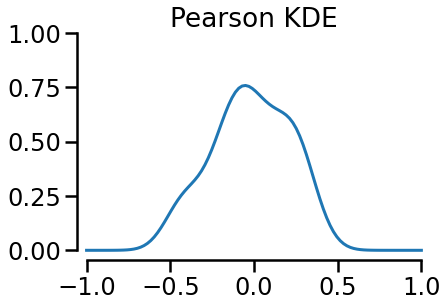

In [461]:
plt.plot(np.linspace(-1,1,100),pr_rpearson.pdf(np.linspace(-2,2,100)), clip_on=False)
sns.despine(offset=10)
plt.title('Pearson KDE')
plt.xlim(-1,1)
plt.ylim(0,1)

Text(0.5, 0, 'Time bin (s)')

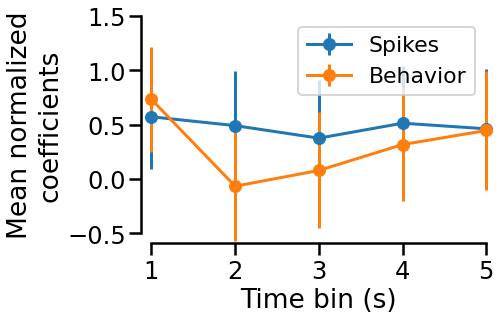

In [448]:
plt.errorbar(np.arange(1,6,1), A_array.mean(0), A_array.std(0), marker='o',clip_on=False)
plt.errorbar(np.arange(1,6,1), B_array.mean(0), A_array.std(0), marker='o',clip_on=False)
plt.ylim(-0.5,1.5)
sns.despine(offset=10)
plt.xlim(1,5)
plt.legend(['Spikes', 'Behavior'], fontsize='small')
plt.ylabel('Mean normalized\ncoefficients')
plt.xlabel('Time bin (s)')

In [288]:
print(A_array[30:].mean(0))
print(B_array[30:].mean(0))
print(np.corrcoef(A_array[30:].mean(0), B_array[30:].mean(0)))


[0.53983549 0.61430386 0.57783597 0.68876267 0.76107731]
[ 0.77443506 -0.17850012  0.18951076  0.42816795  0.58178273]
[[1.         0.09984762]
 [0.09984762 1.        ]]


[[1.         0.62789535]
 [0.62789535 1.        ]]


Text(0, -1, 'R =0.628')

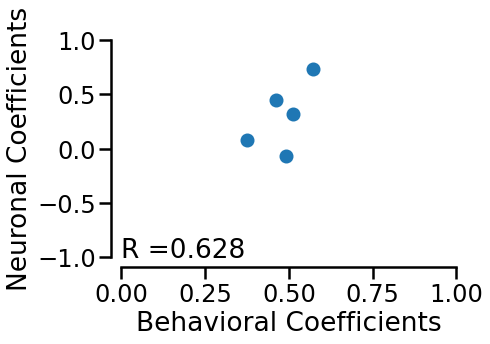

In [409]:
plt.scatter(A_array.mean(0), B_array.mean(0))
print(np.corrcoef(A_array.mean(0), B_array.mean(0)))
plt.ylim(-1,1)
plt.xlim(0,1)
sns.despine(offset=10)
plt.ylabel('Neuronal Coefficients')
plt.xlabel('Behavioral Coefficients')
plt.text(0, -1, s='R =' + str(np.round(np.corrcoef(A_array.mean(0), B_array.mean(0))[0,1], 3)))

In [16]:
#Flexible loop for compiling ephys data in a data frame. 

new_path = os.getcwd() + '/Bahareh/'
good_neurons_dic = pickle.load(open(new_path+"good_cells_BST.pickle", "rb",))
datax = str('_data_all.npy')

animal_list = [['Tabby'],['Shorthair'],['Bengal']]
session_id = 0
n_bins = 5 
results_list=list()

#filenames_to_delete = ['Tabby_20190512_0', 'Shorthair_20190502_0', 'Bengal_20190430_0']
    
for animals in animal_list:
    fname_list = list()
    for date_number in range(20190419,20190600):
        date_string = str(date_number)
        for animal in animals:
            fname = animal + '_' + date_string + '_' + str(session_id)+ '.pickle'
            #print(fname)
            cell_fname = new_path + 'cell_' + fname
            session_fname = new_path + 'session_' + fname
            if os.path.isfile(cell_fname) and os.path.isfile(session_fname):
                fname_list.append(fname[:-7])
            
    # for string in filenames_to_delete:
    #     if string in fname_list:
    #         fname_list.remove(string)

    sorted_fname_list = sorted(fname_list, reverse=True)
    list_of_sessions = len(sorted_fname_list)
    
    for i_session in range(list_of_sessions):

        animal_name = sorted_fname_list[i_session]
        print('session name', animal_name)
        session_fname = 'session_' + animal_name + '.pickle'
        session = pickle.load(open(new_path+session_fname,'rb'))[0]
        
        performance = session['performance']
        num_trials = min(session['num_trials'], cell_list[0]['num_trials'] )
        non_idle_trials = np.invert(session['idle_trials'])[:num_trials]
        
        
        result_row_1 = {'Animal': animals[0],
        'Session': animal_name,
        'Date': int(animal_name[-10:-2]),
        'Performance': performance}        
        #'Codes': all_codes_data[cell_id, trial,:].flatten().tolist()}
                
        results_list.append(result_row_1)

df_p = pd.DataFrame(results_list)

df_p   

session name Tabby_20190514_0
session name Tabby_20190513_0
session name Tabby_20190512_0
session name Tabby_20190511_0
session name Tabby_20190510_0
session name Tabby_20190505_0
session name Tabby_20190504_0
session name Tabby_20190503_0
session name Tabby_20190501_0
session name Tabby_20190430_0
session name Tabby_20190427_0
session name Tabby_20190426_0
session name Tabby_20190423_0
session name Tabby_20190419_0
session name Shorthair_20190508_0
session name Shorthair_20190507_0
session name Shorthair_20190505_0
session name Shorthair_20190504_0
session name Shorthair_20190503_0
session name Shorthair_20190502_0
session name Shorthair_20190501_0
session name Shorthair_20190430_0
session name Shorthair_20190427_0
session name Shorthair_20190423_0
session name Shorthair_20190422_0
session name Shorthair_20190419_0
session name Bengal_20190513_0
session name Bengal_20190512_0
session name Bengal_20190511_0
session name Bengal_20190510_0
session name Bengal_20190509_0
session name Beng

,Animal,Session,Date,Performance
0,Tabby,Tabby_20190514_0,20190514,0.848665
1,Tabby,Tabby_20190513_0,20190513,0.860248
2,Tabby,Tabby_20190512_0,20190512,0.819149
3,Tabby,Tabby_20190511_0,20190511,0.887417
4,Tabby,Tabby_20190510_0,20190510,0.863354
5,Tabby,Tabby_20190505_0,20190505,0.906077
6,Tabby,Tabby_20190504_0,20190504,0.802632
7,Tabby,Tabby_20190503_0,20190503,0.853535
8,Tabby,Tabby_20190501_0,20190501,0.852941
9,Tabby,Tabby_20190430_0,20190430,0.836420


In [31]:
df_joined_p = pd.merge(df_joined, df_p, how='inner', on=['Animal', 'Date', 'Session'], suffixes=('_left', '_right'))
df_joined_p

,Animal,Date,Session,Spikes_b0_coef,Spikes_b1_coef,Spikes_b2_coef,Spikes_b3_coef,Spikes_b4_coef,intercept,max_coef_spikes,...,aic,max_coef_beh,normPulses_b0_coef,normPulses_b1_coef,normPulses_b2_coef,normPulses_b3_coef,normPulses_b4_coef,correlation,Session_num,Performance
0,Bengal,20190419,Bengal_20190419_0,0.758880,-0.256623,-0.370774,0.531366,0.117651,0.139635,0.758880,...,260.868512,0.539343,0.433357,-0.182539,-0.124407,1.000000,-0.278888,0.745886,1,0.783133
1,Bengal,20190422,Bengal_20190422_0,0.922492,-0.348693,-0.637790,0.098748,0.010232,-0.303927,0.922492,...,233.698516,0.322623,0.517985,0.815325,0.241662,0.050987,1.000000,0.033598,2,0.821277
2,Bengal,20190423,Bengal_20190423_0,0.193331,0.823926,0.486472,1.676720,0.825119,1.764237,1.676720,...,202.472302,0.525433,0.474161,-0.201293,0.126077,0.231368,1.000000,-0.106233,3,0.791667
3,Bengal,20190426,Bengal_20190426_0,0.447219,0.865961,0.527027,0.459011,0.417397,-4.275570,0.865961,...,237.620004,0.473931,0.334163,0.355932,1.000000,0.669327,0.741450,-0.403252,4,0.789256
4,Bengal,20190427,Bengal_20190427_0,0.964701,0.959978,1.072478,1.284394,1.581161,-0.369264,1.581161,...,179.610719,0.670694,0.751563,0.285194,-1.000000,-0.151343,0.322228,-0.002890,5,0.850000
5,Bengal,20190430,Bengal_20190430_0,0.557253,1.105150,0.371365,0.499421,0.684025,-3.010134,1.105150,...,284.375407,0.430404,1.000000,-0.577885,-0.632132,0.352918,-0.264491,-0.310514,6,0.827692
6,Bengal,20190501,Bengal_20190501_0,3.360016,2.589567,0.689885,-0.679199,-0.882036,1.669010,3.360016,...,224.997075,0.744785,0.188223,0.103328,0.563415,1.000000,0.539076,-0.845092,7,0.835878
7,Bengal,20190502,Bengal_20190502_0,1.306101,0.492229,0.910045,1.040545,1.537290,-2.976931,1.537290,...,157.048977,0.780510,0.493784,0.223027,0.255929,-0.195173,1.000000,0.635526,8,0.889362
8,Bengal,20190503,Bengal_20190503_0,0.709746,0.828287,1.274661,1.115768,1.220500,-3.070880,1.274661,...,239.407591,0.609038,0.751637,-0.363890,-0.323831,1.000000,0.404022,-0.135701,9,0.881081
9,Bengal,20190504,Bengal_20190504_0,0.860107,0.606719,0.628960,1.046769,0.619013,-4.767479,1.046769,...,173.856099,0.498423,1.000000,0.231842,-0.159761,0.391936,0.263792,0.530467,10,0.811321


(0.0, 18.0)

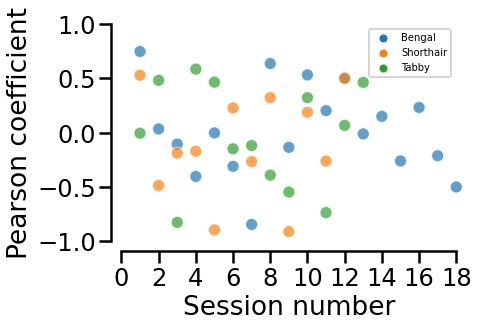

In [32]:
sns.scatterplot(data=df_joined, x='Session_num', y='correlation', hue='Animal', legend=True, clip_on=False, alpha=0.7)
plt.ylabel('Pearson coefficient')
plt.xlabel('Session number')
plt.legend(loc='upper right', fontsize=10, markerscale=0.5)
plt.xticks(np.arange(0,19,2))
sns.despine(offset=10)
plt.ylim(-1,1)
plt.xlim(0,18)

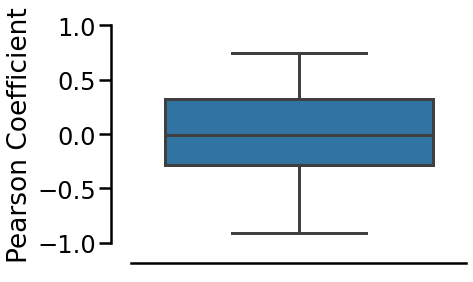

In [33]:
g = sns.boxplot(df_joined['correlation'])
sns.despine(offset=20)
plt.xticks([])
plt.ylabel('Pearson Coefficient')
plt.ylim(-1,1)
g.get_xaxis().set_visible(False)

(-1.0, 1.0)

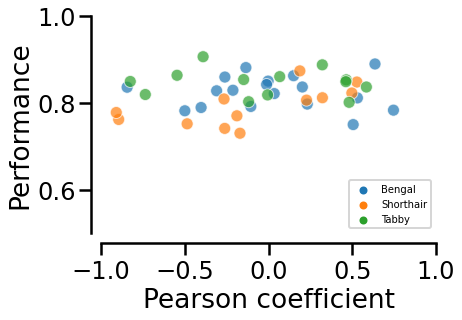

In [39]:
sns.scatterplot(data=df_joined_p, x='correlation', y='Performance', hue='Animal', legend=True, clip_on=False, alpha=0.7)
plt.ylabel('Performance')
plt.xlabel('Pearson coefficient')
plt.legend(loc='lower right', fontsize=10, markerscale=0.5)
#plt.xticks(np.arange(0,19,2))
sns.despine(offset=10)
plt.ylim(0.5,1)
plt.xlim(-1,1)

In [457]:
coefficients_df['max_coef'] = coefficients_df[list(coefficients_df.columns[2:-1])].max(axis=1)
for spike_bin in coefficients_df.columns[2:-1]:
    new_col = 'norm' + spike_bin

    # Relativize each coefficient by dividing it by the maximum coefficient of that session
    coefficients_df[new_col] = coefficients_df[spike_bin] / abs(coefficients_df['max_coef'])
    # coefficients_df['mid_spikes_coef_rel'] = coefficients_df['mid_spikes_coef'] / coefficients_df['max_coef']
    # coefficients_df['late_spikes_coef_rel'] = coefficients_df['late_spikes_coef'] / coefficients_df['max_coef']

coefficients_df


TypeError: unsupported operand type(s) for /: 'str' and 'float'

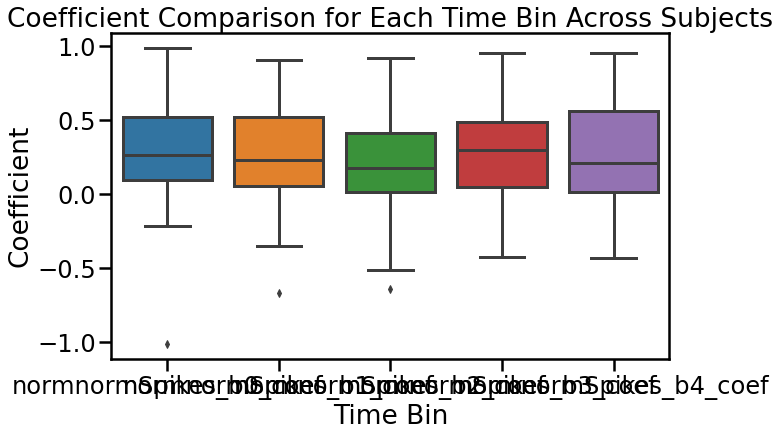

In [100]:
melted_df = coefficients_df.melt(id_vars='subject', 
                                 value_vars=list(coefficients_df.columns[-5:]),
                                 var_name='Time Bin', 
                                 value_name='Coefficient')

plt.figure(figsize=(10, 6))
sns.boxplot(x='Time Bin', y='Coefficient', data=melted_df)#, hue='subject')
plt.title('Coefficient Comparison for Each Time Bin Across Subjects')
plt.show()

In [101]:
new_df

,Animal,Session,Date,Trial,Total Pulse,High_trial,High_choice,Spike times,Sbin_1,Sbin_2,Sbin_3,Sbin_4,Sbin_5
0,Bengal,Bengal_20190419_0,20190419,0,5,0,1,"[0.5226333333333333, 0.5642333333333334, 0.809...",-0.288150,-0.241636,-0.370252,-0.243245,-0.382146
1,Bengal,Bengal_20190419_0,20190419,1,7,0,0,"[0.6528666666666667, 0.7066, 0.744733333333333...",-0.438663,-0.241636,-0.173054,-0.485688,-0.180346
2,Bengal,Bengal_20190419_0,20190419,2,3,0,0,"[0.8579666666666667, 1.1130666666666666, 1.367...",-0.344592,-0.338483,-0.113894,-0.465484,-0.563767
3,Bengal,Bengal_20190419_0,20190419,3,5,0,0,"[0.5888666666666666, 0.7111333333333333, 0.775...",-0.777316,-0.570918,-0.409691,-0.344263,-0.422506
4,Bengal,Bengal_20190419_0,20190419,4,16,1,1,"[0.5882333333333334, 0.6176666666666667, 0.635...",-0.175266,-0.338483,-0.449131,-0.324059,-0.624307
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10826,Tabby,Tabby_20190514_0,20190514,331,4,0,0,"[1.2072333333333334, 1.2364666666666666, 1.524...",2.327005,1.734059,2.508836,2.181185,1.676217
10827,Tabby,Tabby_20190514_0,20190514,332,4,0,0,"[0.6939, 0.7043, 1.6621, 1.6779333333333333, 1...",1.630885,1.056125,1.365089,2.403424,0.949736
10828,Tabby,Tabby_20190514_0,20190514,333,11,1,0,"[0.8364666666666667, 0.9780666666666666, 1.001...",2.571588,2.276407,1.029853,2.120574,1.272617
10829,Tabby,Tabby_20190514_0,20190514,334,16,1,1,"[0.8385666666666667, 0.9011, 0.902866666666666...",3.136010,2.799385,3.021550,2.383220,3.129180


Index(['Sbin_1', 'Sbin_2', 'Sbin_3', 'Sbin_4', 'Sbin_5'], dtype='object')
Optimization terminated successfully.
         Current function value: 0.685441
         Iterations 4
14860.018732058648
Fitting generalized linear model using glmer (family binomial) with Wald confidence intervals...



R[write to console]: boundary (singular) fit: see help('isSingular')



boundary (singular) fit: see help('isSingular') 

Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: High_choice~Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5+(Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5||Animal/Session)

Family: binomial	 Inference: parametric

Number of observations: 10831	 Groups: {'Session:Animal': 43.0, 'Animal': 3.0}

Log-likelihood: -6563.534 	 AIC: 13163.068

Random effects:

                         Name     Var    Std
Session.Animal         Sbin_5   0.618  0.786
Session.Animal.1       Sbin_4   0.631  0.794
Session.Animal.2       Sbin_3   0.451  0.671
Session.Animal.3       Sbin_2   0.668  0.817
Session.Animal.4       Sbin_1   0.739  0.860
Session.Animal.5  (Intercept)  10.606  3.257
Animal                 Sbin_5   0.064  0.253
Animal.1               Sbin_4   0.046  0.214
Animal.2               Sbin_3   0.111  0.333
Animal.3               Sbin_2   0.000  0.000
Animal.4               Sbin_1   0.000  0.000
Animal.5          (Intercept)   3.469  1.863

No random effe

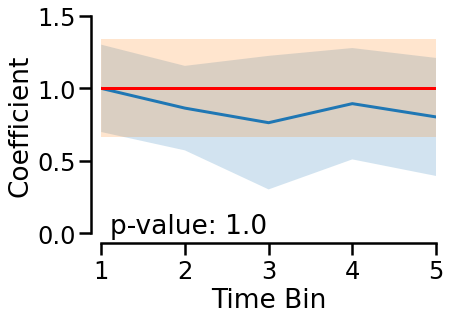

In [462]:
import statsmodels.api as sm
listvar = new_df.columns[-5:]
print(listvar)

f0 = 'High_choice~Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5'
f1 = 'High_choice~Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5+(Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5||Animal/Session)'
f2 = 'High_choice~I(Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5)+(I(Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5)||Animal/Session)'

m0 = sm.Logit.from_formula(f0, data=new_df)#Lm(formula = f0, family='binomial', data = df_prueba)
m_varying_coefs = Lmer(formula = f1, family='binomial', data = new_df)
m_single_coef = Lmer(formula = f2, family='binomial', data = new_df)

r0 = m0.fit()#, control="optimizer='bobyqa'")
aic_value_r0 = r0.aic
print(aic_value_r0)
m_varying_coefs.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")
m_single_coef.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")

#culito = m_varying_coefs.predict(df_prueba, verify_predictions=False, skip_data_checks=True)
#culito2 = m_single_coef.predict(df_prueba, verify_predictions=False, skip_data_checks=True)

mvc_loglik = m_varying_coefs.logLike
msc_loglik = m_single_coef.logLike

statistic = -2*(msc_loglik-mvc_loglik)
p_val = scipy.stats.chi2.sf(statistic, (len(m_varying_coefs.coefs)-len(m_single_coef.coefs)))

m_vc_confints = m_varying_coefs.confint(listvar)
lower_limit_vc = m_vc_confints['2.5 %']
upper_limit_vc = m_vc_confints['97.5 %']

m_sc_confints = m_single_coef.confint()
m_sc_confints = m_sc_confints.dropna()
lower_limit_sc = m_sc_confints['2.5 %'][1]
upper_limit_sc = m_sc_confints['97.5 %'][1]

mvc_df = result_to_table(m_varying_coefs)
msc_df = result_to_table(m_single_coef)

print(m_varying_coefs.factors)

betas = mvc_df['b'][:len(listvar)]
single_beta = msc_df['b'][0]/msc_df['b'][0].max()
fig = plt.figure()
plt.plot(range(len(listvar)), betas/betas.max())
plt.fill_between(range(len(listvar)), upper_limit_vc/betas.max(), lower_limit_vc/betas.max(), alpha=0.2) #betas.max()
plt.axhline(single_beta, color='r')
plt.fill_between(range(len(listvar)), upper_limit_sc/msc_df['b'][0].max(), lower_limit_sc/msc_df['b'][0].max(), alpha=0.2)
plt.ylim(0,1.5)
plt.xlim(0,len(listvar)-1)
ymin, ymax = plt.ylim()
plt.xticks(np.arange(len(listvar)), np.arange(1,len(listvar)+1))
plt.text(0.1,ymin, 'p-value: '+str(p_val))
plt.xlabel('Time Bin')
plt.ylabel('Coefficient')
sns.despine(offset=10)

#r0.summary()



In [289]:
coeff_spikes

array([1.004, 0.867, 0.766, 0.898, 0.806])

Text(0, 0, 'R=-0.382')

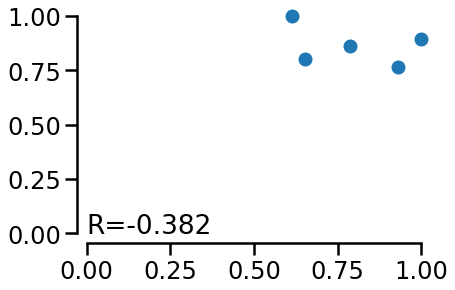

In [465]:
coeff_beh = np.array([0.6122449,0.78571429,0.93112245,1,0.65178571])
coeff_spikes = np.array(mvc_df['b'].values/mvc_df['b'].values.max())

plt.scatter(coeff_beh, coeff_spikes, clip_on=False)
plt.ylim(0,1)
plt.xlim(0,1)
sns.despine(offset=10)
plt.text (0, 0, s='R=' + str(np.round(np.corrcoef(coeff_beh,coeff_spikes)[0,1], 3)))


In [ ]:
def df_filter(df, delayt, binsize):

    new_df = df.loc[df['Window'] == delayt]
    vars = list(new_df.columns[9:14]) #[7:])
    f_vars = vars[:int(delayt/binsize)]

    return new_df, f_vars

def formula_maker(listvar, pred_choice=True, pred_id=False, interaction=True):

    if pred_choice ==  True:
        y = str('Choice ~ ')

    if pred_id == True:
        y = str('Reward_side ~ ')

    separator = '+'
    lin_pred_alt = str('I(') + separator.join(listvar)
    lin_pred = str('(') + separator.join(listvar)
    int_term = str(') * Difficulty + ')
    ranef = str('(1|Animal)') #+ (Window|Animal) :Date

    if interaction == False:
        y = y
        separator = '+'
        lin_pred_alt = str('I(') + separator.join(listvar) + str(')')
        lin_pred = separator.join(listvar)
        int_term = str(' + ')
        ranef = str('(1|Animal)') #+ (Window|Animal) :Date

    formula_sep =  (y+lin_pred+int_term+ranef)
    formula_one_beta = (y+lin_pred_alt+int_term+ranef)
    # print(formula_sep)
    # print(formula_one_beta)

    return formula_sep, formula_one_beta

def model_fit_compare(df, f1, f2, listvar, factor='Difficulty'):

    levels = list(np.roll(df[factor].unique(), -1).astype(str))
    print('This are the levels of', factor, levels)

    m_varying_coefs = Lmer(formula = f1, family='binomial', data = df)
    m_single_coef = Lmer(formula = f2, family='binomial', data = df)

    if len(levels) < 2:
        m_varying_coefs.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")
        m_single_coef.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")
        
    else:

        m_varying_coefs.fit(factors={factor: levels}, summarize=True, 
                            ordered=True, verbose=True, control="optimizer='bobyqa'")
        m_single_coef.fit(factors={factor: levels}, summarize=True, 
                        ordered=True, verbose=True, control="optimizer='bobyqa'")

    #print(len())

    mvc_loglik = m_varying_coefs.logLike
    msc_loglik = m_single_coef.logLike

    statistic = -2*(msc_loglik-mvc_loglik)
    p_val = scipy.stats.chi2.sf(statistic, (len(m_varying_coefs.coefs)-len(m_single_coef.coefs)))
    
    m_vc_confints = m_varying_coefs.confint(listvar)
    lower_limit_vc = m_vc_confints['2.5 %']
    upper_limit_vc = m_vc_confints['97.5 %']

    #print(upper_limit_vc)
    #print(lower_limit_vc)


    m_sc_confints = m_single_coef.confint()
    m_sc_confints = m_sc_confints.dropna()
    lower_limit_sc = m_sc_confints['2.5 %'][1]
    upper_limit_sc = m_sc_confints['97.5 %'][1]

    mvc_df = result_to_table(m_varying_coefs)
    msc_df = result_to_table(m_single_coef)

    print(m_varying_coefs.factors)

    betas = mvc_df['b'][:len(listvar)]
    single_beta = msc_df['b'][0]/msc_df['b'][0].max()
    fig = plt.figure()
    plt.plot(range(len(listvar)), betas/betas.max())
    plt.fill_between(range(len(listvar)), upper_limit_vc/betas.max(), lower_limit_vc/betas.max(), alpha=0.2)
    plt.axhline(single_beta, color='r')
    plt.fill_between(range(len(listvar)), upper_limit_sc/msc_df['b'][0].max(), lower_limit_sc/msc_df['b'][0].max(), alpha=0.2)
    #plt.ylim(0,1)
    plt.xlim(0,len(listvar)-1)
    ymin, ymax = plt.ylim()
    plt.xticks(np.arange(len(listvar)), np.arange(1,len(listvar)+1))
    plt.text(0.1,ymin, 'p-value: '+str(p_val))
    plt.xlabel('Time Bin')
    plt.ylabel('Coefficient')
    sns.despine(offset=10)
    

    return fig, p_val, mvc_df, msc_df

In [15]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from pymer4.simulate import simulate_lmm, simulate_lm
from pymer4.models import Lm, Lmer, Lm2
from pymer4.utils import result_to_table

In [108]:
predicted_values =  np.round(culito)
print(predicted_values)
accuracy = accuracy_score(df_prueba['High_trial'].values, predicted_values)
print(accuracy)

[1. 1. 1. ... 0. 1. 0.]
0.6460160649986151


In [96]:
listvar = df_prueba.columns[-5:]
print(listvar)
f1 = 'High_trial~Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5+(1|Session)'
f2 = 'High_trial~I(Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5)+(1|Session)'

kf = KFold(n_splits=5, shuffle=True, random_state=42)
accuracies = [] 

for train_index, test_index in kf.split(df_prueba):
    train_data, test_data = df_prueba.iloc[train_index], df_prueba.iloc[test_index]
    print(len(train_data), len(test_data))
    
    m_varying_coefs = Lmer(formula = f1, family='binomial', data = train_data)
    m_single_coef = Lmer(formula = f2, family='binomial', data = train_data)
    m_varying_coefs.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")
    m_single_coef.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")

    culito = m_varying_coefs.predict(test_data, verify_predictions=True)#skip_data_checks=True)
    culito2 = m_single_coef.predict(test_data, verify_predictions=True)#skip_data_checks=True)

    mvc_loglik = m_varying_coefs.logLike
    msc_loglik = m_single_coef.logLike

    statistic = -2*(msc_loglik-mvc_loglik)
    p_val = scipy.stats.chi2.sf(statistic, (len(m_varying_coefs.coefs)-len(m_single_coef.coefs)))

    m_vc_confints = m_varying_coefs.confint(listvar)
    lower_limit_vc = m_vc_confints['2.5 %']
    upper_limit_vc = m_vc_confints['97.5 %']

    #print(upper_limit_vc)

    

    

    y_trial_type = test_data['High_trial'].values
    y_choice = test_data['High_choice'].values

    y_pred_mc = test_data['MC_Pred']
    y_pred_sc = test_data['SC_Pred']

    accuracy = accuracy_score(y_trial_type, y_pred_mc)
    accuracies.append(accuracy)

# mse_mc = mean_squared_error(y_trial_type, y_pred_mc)
# r2_mc = r2_score(y_trial_type, y_pred_mc)

# mse_sc = mean_squared_error(y_trial_type, y_pred_sc)
# r2_sc = r2_score(y_trial_type, y_pred_sc)
#print(lower_limit_vc)


m_sc_confints = m_single_coef.confint()
m_sc_confints = m_sc_confints.dropna()
lower_limit_sc = m_sc_confints['2.5 %'][1]
upper_limit_sc = m_sc_confints['97.5 %'][1]

mvc_df = result_to_table(m_varying_coefs)
msc_df = result_to_table(m_single_coef)

print(m_varying_coefs.factors)

betas = mvc_df['b'][:len(listvar)]
single_beta = msc_df['b'][0]/msc_df['b'][0].max()
fig = plt.figure()
plt.plot(range(len(listvar)), betas/betas.max())
plt.fill_between(range(len(listvar)), upper_limit_vc/betas.max(), lower_limit_vc/betas.max(), alpha=0.2) #betas.max()
plt.axhline(single_beta, color='r')
plt.fill_between(range(len(listvar)), upper_limit_sc/msc_df['b'][0].max(), lower_limit_sc/msc_df['b'][0].max(), alpha=0.2)
#plt.ylim(0,1)
plt.xlim(0,len(listvar)-1)
ymin, ymax = plt.ylim()
plt.xticks(np.arange(len(listvar)), np.arange(1,len(listvar)+1))
plt.text(0.1,ymin, 'p-value: '+str(p_val))
plt.xlabel('Time Bin')
plt.ylabel('Coefficient')
sns.despine(offset=10)

print(accuracies)

Index(['Sbin_1', 'Sbin_2', 'Sbin_3', 'Sbin_4', 'Sbin_5'], dtype='object')
8664 2167
Fitting generalized linear model using glmer (family binomial) with Wald confidence intervals...

Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: High_trial~Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5+(1|Session)

Family: binomial	 Inference: parametric

Number of observations: 8664	 Groups: {'Session': 43.0}

Log-likelihood: -5381.952 	 AIC: 10777.903

Random effects:

                Name     Var    Std
Session  (Intercept)  14.325  3.785

No random effect correlations specified

Fixed effects:

Fitting generalized linear model using glmer (family binomial) with Wald confidence intervals...

Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: High_trial~I(Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5)+(1|Session)

Family: binomial	 Inference: parametric

Number of observations: 8664	 Groups: {'Session': 43.0}

Log-likelihood: -5396.875 	 AIC: 10799.751

Random effects:

                N

ValueError: operands could not be broadcast together with shapes (8664,) (2167,) 

In [498]:
def df_filter(df, delayt, binsize):

    #new_df = df.loc[df['Window'] == delayt]
    vars = list(df.columns[-5:]) #[7:])
    #print(vars)
    f_vars = vars[:int(delayt/binsize)]
    #print(f_vars)

    return f_vars

def formula_maker(listvar, pred_choice=True, pred_id=False, interaction=True):

    if pred_choice ==  True:
        y = str('Choice ~ ')

    if pred_id == True:
        y = str('Reward_side ~ ')

    separator = '+'
    lin_pred_alt = str('I(') + separator.join(listvar)
    lin_pred = str('(') + separator.join(listvar)
    int_term = str(') * Difficulty + ')
    ranef = str('(1|Animal)') #+ (Window|Animal) :Date

    if interaction == False:
        y = y
        separator = '+'
        lin_pred_alt = str('I(') + separator.join(listvar) + str(')')
        lin_pred = separator.join(listvar)
        int_term = str(' + ')
        ranef = str('(1|Animal)') #+ (Window|Animal) :Date

    formula_sep =  (y+lin_pred+int_term+ranef)
    formula_one_beta = (y+lin_pred_alt+int_term+ranef)
    # print(formula_sep)
    # print(formula_one_beta)

    return formula_sep, formula_one_beta

def model_fit_compare(df, f1, f2, listvar, factor='Difficulty'):

    levels = list(np.roll(df[factor].unique(), -1).astype(str))
    print('This are the levels of', factor, levels)

    m_varying_coefs = Lmer(formula = f1, family='binomial', data = df)
    m_single_coef = Lmer(formula = f2, family='binomial', data = df)

    if len(levels) < 2:
        m_varying_coefs.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")
        m_single_coef.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")
        
    else:

        m_varying_coefs.fit(factors={factor: levels}, summarize=True, 
                            ordered=True, verbose=True, control="optimizer='bobyqa'")
        m_single_coef.fit(factors={factor: levels}, summarize=True, 
                        ordered=True, verbose=True, control="optimizer='bobyqa'")

    #print(len())

    mvc_loglik = m_varying_coefs.logLike
    msc_loglik = m_single_coef.logLike

    statistic = -2*(msc_loglik-mvc_loglik)
    p_val = scipy.stats.chi2.sf(statistic, (len(m_varying_coefs.coefs)-len(m_single_coef.coefs)))
    
    m_vc_confints = m_varying_coefs.confint(listvar)
    lower_limit_vc = m_vc_confints['2.5 %']
    upper_limit_vc = m_vc_confints['97.5 %']

    #print(upper_limit_vc)
    #print(lower_limit_vc)


    m_sc_confints = m_single_coef.confint()
    m_sc_confints = m_sc_confints.dropna()
    lower_limit_sc = m_sc_confints['2.5 %'][1]
    upper_limit_sc = m_sc_confints['97.5 %'][1]

    mvc_df = result_to_table(m_varying_coefs)
    msc_df = result_to_table(m_single_coef)

    print(m_varying_coefs.factors)

    betas = mvc_df['b'][:len(listvar)]
    single_beta = msc_df['b'][0]/msc_df['b'][0].max()
    fig = plt.figure()
    plt.plot(range(len(listvar)), betas/betas.max())
    plt.fill_between(range(len(listvar)), upper_limit_vc/betas.max(), lower_limit_vc/betas.max(), alpha=0.2)
    plt.axhline(single_beta, color='r')
    plt.fill_between(range(len(listvar)), upper_limit_sc/msc_df['b'][0].max(), lower_limit_sc/msc_df['b'][0].max(), alpha=0.2)
    #plt.ylim(0,1)
    plt.xlim(0,len(listvar)-1)
    ymin, ymax = plt.ylim()
    plt.xticks(np.arange(len(listvar)), np.arange(1,len(listvar)+1))
    plt.text(0.1,ymin, 'p-value: '+str(p_val))
    plt.xlabel('Time Bin')
    plt.ylabel('Coefficient')
    sns.despine(offset=10)
    

    return fig, p_val, mvc_df, msc_df

In [208]:
df_prueba_2 = df_all.groupby(['Animal','Session', 'Cell'], as_index=False).agg(
    {'High Choice': 'first', 
     'Spike times': lambda x: sum(x, []),
     'Codes': lambda x: np.nanmean(np.array(x.tolist()), axis=0)})

df_prueba_2


,Animal,Session,Cell,High Choice,Spike times,Codes
0,Bengal,Bengal_20190419_0,0,1,"[0.5226333333333333, 0.5642333333333334, 0.809...","[4.823783987760544, 5.059598684310913, 9.13498..."
1,Bengal,Bengal_20190419_0,1,1,"[0.7299, 0.981, 0.9975333333333334, 1.01403333...","[3.904435704151789, 5.433044329285622, 6.22999..."
2,Bengal,Bengal_20190419_0,2,1,"[0.5057666666666667, 0.5075, 0.517733333333333...","[8.465045054753622, 4.6171281933784485, 5.7029..."
3,Bengal,Bengal_20190419_0,3,1,"[0.7808666666666667, 1.3553666666666666, 1.394...","[5.695010622342427, 6.9273663520812985, 4.3735..."
4,Bengal,Bengal_20190419_0,4,1,"[3.154933333333333, 1.3557666666666666, 1.7172...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
...,...,...,...,...,...,...
770,Tabby,Tabby_20190514_0,17,0,"[0.7731, 0.9485333333333333, 1.594433333333333...","[7.541449737548828, 8.257490052117241, 7.48265..."
771,Tabby,Tabby_20190514_0,18,0,"[0.7204333333333334, 1.8248333333333333, 1.841...","[5.754426836967468, 7.637874220098768, 7.87758..."
772,Tabby,Tabby_20190514_0,19,0,"[0.5524333333333333, 0.5601, 0.588566666666666...","[6.136069104075432, 6.252436448546017, 7.11385..."
773,Tabby,Tabby_20190514_0,20,0,"[0.5544666666666667, 0.9694333333333334, 1.080...","[6.4076169861687555, 4.427041785418988, 4.5964..."


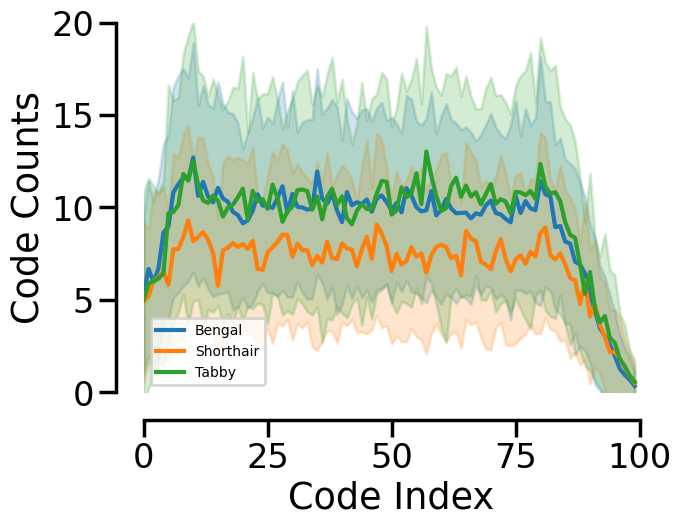

In [467]:
df_prueba_3 = df_all.groupby(['Animal','Session', 'Cell'], as_index=False).agg(
    {'High Choice': 'first', 
     'Spike times': lambda x: sum(x, []),
     'Codes': lambda x: np.count_nonzero(np.array(x.tolist()), axis=0)})

df_expanded_3 = df_prueba_3.explode('Codes').reset_index(drop=True)
unique_groups = df_expanded_3['Session'].unique()
group_map = {group: np.arange(100) for group in unique_groups}
df_expanded_3['Index'] = df_expanded_3.groupby(['Animal','Session']).cumcount()%100
sns.lineplot(data=df_expanded_3, x='Index', y='Codes', hue='Animal', errorbar='sd')
plt.legend(fontsize=10, loc='lower left')
plt.ylabel('Code Counts')
plt.xlabel('Code Index')
plt.xlim(0,100)
plt.ylim(0,20)
sns.despine(offset=20)

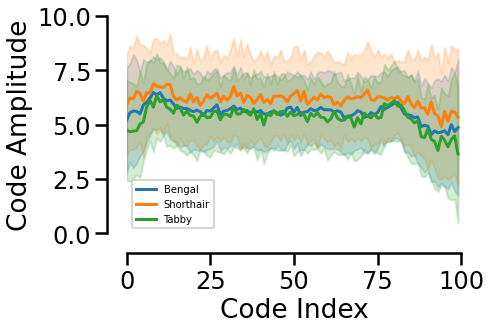

In [209]:
df_expanded_2 = df_prueba_2.explode('Codes').reset_index(drop=True)
unique_groups = df_expanded_2['Session'].unique()
group_map = {group: np.arange(100) for group in unique_groups}
df_expanded_2['Index'] = df_expanded_2.groupby(['Animal','Session']).cumcount()%100
sns.lineplot(data=df_expanded_2, x='Index', y='Codes', hue='Animal', errorbar='sd')
plt.legend(fontsize=10, loc='lower left')
plt.ylabel('Code Amplitude')
plt.xlabel('Code Index')
plt.xlim(0,100)
plt.ylim(0,10)
sns.despine(offset=20)

In [236]:
df_shorthair_fv = df_expanded_2.loc[df_expanded_2['Animal']=='Shorthair']
df_shorthair_fv_test = df_shorthair_fv.groupby('Index')['Codes'].agg(['mean', 'std']).reset_index()
df_shorthair_fv_test = df_shorthair_fv_test.rename(columns={'Index': 'Code_index'})

# Convert int64 columns to int32 to ensure compatibility with MATLAB
for col in df_shorthair_fv_test.select_dtypes(include=['int64']).columns:
    df_shorthair_fv_test[col] = df_shorthair_fv_test[col].astype('int32')

print(df_shorthair_fv_test.columns)

# Convert the DataFrame to a dictionary with each column as a separate key
data_dict = {col: df_shorthair_fv_test[col].values for col in df_shorthair_fv_test.columns}

# Save the dictionary as a .mat file
#savemat('data.mat', data_dict)
#data_dict = {'data': df_shorthair_fv_test.to_dict('list')}  # Using 'list' preserves the DataFrame structure in the .mat file
#print(type(data_dict['data']['Code Index'][0]))

scipy.io.savemat('shorthair_code_datax.mat', data_dict)


Index(['Code_index', 'mean', 'std'], dtype='object')


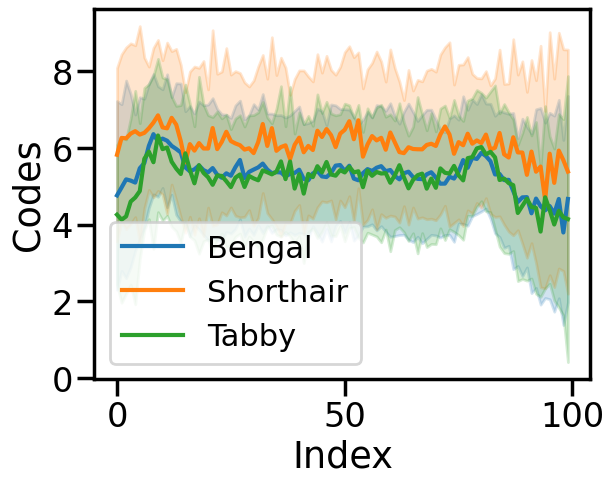

In [308]:
df_expanded_2 = df_prueba_2.explode('Codes').reset_index(drop=True)
unique_groups = df_expanded_2['Session'].unique()
group_map = {group: np.arange(100) for group in unique_groups}
df_expanded_2['Index'] = df_expanded_2.groupby(['Animal','Session']).cumcount()%100
sns.lineplot(data=df_expanded_2, x='Index', y='Codes', hue='Animal', errorbar='sd')
plt.legend(fontsize='small', loc='best')
plt.ylabel('Code Amplitude')
plt.xlabel('Code Index')

In [354]:
df_all['cbin1'] = df_all['Codes'].apply(lambda x: x[:20])
df_all

,Animal,Session,Date,Trial,Total Pulse,High Trial,High Choice,Correct,Cell,Spike times,Codes,cbin1
0,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,1,"[1.9574666666666667, 2.1328666666666667, 2.137...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
1,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,8,"[0.5156333333333334, 0.5661333333333334, 0.585...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
2,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,14,"[0.5873333333333334, 0.5904, 0.680133333333333...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
3,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,2,"[0.5084333333333333, 0.5182333333333333, 0.527...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
4,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,7,"[0.5064, 0.5174666666666666, 0.571466666666666...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
87082,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,10,"[2.2700666666666667, 3.8309, 3.8561666666666667]","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
87083,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,3,"[3.6718, 4.5687, 4.768633333333334]","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
87084,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,7,"[0.5664, 0.5755333333333333, 0.581, 0.61483333...","[nan, nan, nan, 2.8746085166931152, nan, nan, ...","[nan, nan, nan, 2.8746085166931152, nan, nan, ..."
87085,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,11,"[0.501, 0.5212, 0.5597333333333333, 0.74036666...","[nan, nan, nan, 1.2648662328720093, nan, nan, ...","[nan, nan, nan, 1.2648662328720093, nan, nan, ..."


In [358]:
#df_prueba['first_20'] = df_prueba['Codes'].apply(lambda x: x[:20])
df_prueba['cbin1'] = df_prueba['Codes'].apply(lambda x: np.nanmean(x[:20]))
df_prueba['cbin2'] = df_prueba['Codes'].apply(lambda x: np.nanmean(x[20:40]))
df_prueba['cbin3'] = df_prueba['Codes'].apply(lambda x: np.nanmean(x[40:60]))
df_prueba['cbin4'] = df_prueba['Codes'].apply(lambda x: np.nanmean(x[60:80]))
df_prueba['cbin5'] = df_prueba['Codes'].apply(lambda x: np.nanmean(x[80:]))

df_prueba

,Animal,Session,Trial,Total Pulse,High Trial,High Choice,Spike times,Codes,cbin1,cbin2,cbin3,cbin4,cbin5
0,Bengal,Bengal_20190419_0,0,5,0,1,"[0.5226333333333333, 0.5642333333333334, 0.809...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.358183,0.000000,0.178944,0.394915,0.001821
1,Bengal,Bengal_20190419_0,1,7,0,0,"[0.6528666666666667, 0.7066, 0.744733333333333...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.298016,0.218588,0.239669,0.321964,0.000000
2,Bengal,Bengal_20190419_0,2,3,0,0,"[0.8579666666666667, 1.1130666666666666, 1.367...","[0.0, 0.0, 0.0, 0.0, 3.248365604877472, 0.0, 0...",0.162418,0.000000,0.289193,0.000000,0.000000
3,Bengal,Bengal_20190419_0,3,5,0,0,"[0.5888666666666666, 0.7111333333333333, 0.775...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,0.262339,0.000000,0.000000,0.175813
4,Bengal,Bengal_20190419_0,4,16,1,1,"[0.5882333333333334, 0.6176666666666667, 0.635...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.80520482...",0.557753,0.475327,0.476626,0.355017,0.277262
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9864,Tabby,Tabby_20190514_0,331,4,0,0,"[1.2072333333333334, 1.2364666666666666, 1.524...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.166095,0.000000,0.184226,0.208011,0.020326
9865,Tabby,Tabby_20190514_0,332,4,0,0,"[0.6939, 0.7043, 1.6621, 1.6779333333333333, 1...","[0.0, 1.5305603265762329, 0.0, 0.0, 0.0, 0.0, ...",0.076528,0.102708,0.173546,0.068643,0.000000
9866,Tabby,Tabby_20190514_0,333,11,1,0,"[0.8364666666666667, 0.9780666666666666, 1.001...","[0.0, 0.0, 0.0, 0.0, 0.0, 1.1123631656169892, ...",0.279701,0.278655,0.109483,0.352836,0.000000
9867,Tabby,Tabby_20190514_0,334,16,1,1,"[0.8385666666666667, 0.9011, 0.902866666666666...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.372827,0.403705,0.479943,0.265827,0.279087


In [13]:
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split, cross_val_score, permutation_test_score, StratifiedKFold, RepeatedStratifiedKFold
from sklearn.metrics import accuracy_score


In [141]:
score_choice = np.zeros((len(df_prueba['Session'].unique()),5))
perm_choice = np.zeros((len(df_prueba['Session'].unique()),5,1000))
pvalue_choice = np.zeros((len(df_prueba['Session'].unique()),5))
# print(score_choice.shape)


for i, s in zip(df_prueba['Session'].unique(), range(len(df_prueba['Session'].unique()))):
    df_analysis = df_prueba.loc[df_prueba['Session']==i]
    clf1 = LogisticRegression(solver='liblinear')
    clf2 = LogisticRegression(solver='liblinear')
    clf3 = LogisticRegression(solver='liblinear')
    clf4 = LogisticRegression(solver='liblinear')
    clf5 = LogisticRegression(solver='liblinear')

    cv = StratifiedKFold(5, shuffle=True)#, random_state=0)

    score_choice[s,0], perm_choice[s,0,:], _ = permutation_test_score(clf1, df_analysis[['cbin1']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                    scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice[s,1], perm_choice[s,1,:], _ = permutation_test_score(clf2, df_analysis[['cbin2']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                    scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice[s,2], perm_choice[s,2,:], _ = permutation_test_score(clf3, df_analysis[['cbin3']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice[s,3], perm_choice[s,3,:], _ = permutation_test_score(clf4, df_analysis[['cbin4']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice[s,4], perm_choice[s,4,:], _ = permutation_test_score(clf5, df_analysis[['cbin5']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
perm_choice_median = np.zeros(5)
perm_choice_std = np.zeros(5)

for i in range(5):
    perm_choice_median[i] = np.median(perm_choice[:,i,:])
    perm_choice_std[i] = perm_choice[:,i,:].std()

plt.errorbar(x=np.arange(1,6), y=score_choice.mean(0), yerr=score_choice.std(0), clip_on=False)
plt.errorbar(x=np.arange(1,6), y=perm_choice_median, yerr=perm_choice_std, clip_on=False)
plt.xlabel('Time bins')
plt.ylabel('Accuracy')
plt.xticks(np.arange(1,6))
plt.xlim(1,5)
plt.ylim(0.5,1)
plt.title('Choice prediction based on independent code information', fontsize='small', pad=20)
sns.despine(offset=20)



#print(score_choice_cum.std(0))
    

KeyError: "None of [Index(['cbin1'], dtype='object')] are in the [columns]"

In [409]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedStratifiedKFold
import matplotlib.pyplot as plt

# Example datasets
datasets = [
    pd.DataFrame({
        'Feature1': np.random.rand(100),
        'Feature2': np.random.rand(100),
        'Target': np.random.randint(0, 2, 100)
    }),
    pd.DataFrame({
        'Feature1': np.random.rand(150),
        'Feature2': np.random.rand(150),
        'Target': np.random.randint(0, 2, 150)
    })
]

# Repeated Stratified K-Fold (5 folds, 3 repetitions)
n_splits = 5
n_repeats = 3
rskf = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_repeats, random_state=42)

# List to store results for each dataset
results = []

# Iterate over each dataset
for idx, df in enumerate(datasets):
    X = df[['Feature1', 'Feature2']]  # Features as DataFrame
    y = df['Target']  # Target as Series
    
    fold_results = []  # To store results for each fold of this dataset
    all_coefficients = []  # To store coefficients of each fold
    
    for train_index, test_index in rskf.split(X, y):
        # Split the DataFrame into training and testing sets
        X_train_df = X.iloc[train_index]
        X_test_df = X.iloc[test_index]
        y_train_df = y.iloc[train_index]
        y_test_df = y.iloc[test_index]

        # Convert the split DataFrames/Series to numpy arrays
        X_train = X_train_df.to_numpy()
        X_test = X_test_df.to_numpy()
        y_train = y_train_df.to_numpy()
        y_test = y_test_df.to_numpy()

        # Initialize and fit the Logistic Regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)

        # Get the coefficients and store them
        coefficients = model.coef_
        all_coefficients.append(coefficients)
    
    # Compute average coefficients across all folds for this dataset
    avg_coefficients = np.mean(np.vstack(all_coefficients), axis=0)
    
    # Store the average coefficients for the current dataset
    results.append({
        'dataset_index': idx + 1,
        'average_coefficients': avg_coefficients
    })

# Plotting the average coefficients for each dataset
plt.figure(figsize=(10, 6))

for result in results:
    dataset_index = result['dataset_index']
    avg_coefficients = result['average_coefficients'].flatten()
    
    # Plot the average coefficients for the dataset
    plt.bar(
        np.arange(len(avg_coefficients)) + (dataset_index - 1) * 0.3,  # Offset for each dataset
        avg_coefficients,
        width=0.3,
        label=f'Dataset {dataset_index}'
    )

# Label the plot
plt.xlabel('Features')
plt.ylabel('Average Coefficient Value')
plt.title('Average Coefficients Across Folds for Each Dataset')
plt.xticks([0, 1], ['Feature1', 'Feature2'])  # Adjust this if you have more features
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()



[0.72219647 0.7184705  0.72423717 0.72663109 0.67160752]
[0.04710716 0.04041737 0.04769815 0.04400849 0.04812944]


In [459]:
df_prueba

,Animal,Session,Trial,Total Pulse,High Trial,High Choice,Spike times,Codes,cbin1,cbin2,cbin3,cbin4,cbin5
0,Bengal,Bengal_20190419_0,0,5,0,1,"[0.5226333333333333, 0.5642333333333334, 0.809...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.358183,0.000000,0.178944,0.394915,0.001821
1,Bengal,Bengal_20190419_0,1,7,0,0,"[0.6528666666666667, 0.7066, 0.744733333333333...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.298016,0.218588,0.239669,0.321964,0.000000
2,Bengal,Bengal_20190419_0,2,3,0,0,"[0.8579666666666667, 1.1130666666666666, 1.367...","[0.0, 0.0, 0.0, 0.0, 3.248365604877472, 0.0, 0...",0.162418,0.000000,0.289193,0.000000,0.000000
3,Bengal,Bengal_20190419_0,3,5,0,0,"[0.5888666666666666, 0.7111333333333333, 0.775...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,0.262339,0.000000,0.000000,0.175813
4,Bengal,Bengal_20190419_0,4,16,1,1,"[0.5882333333333334, 0.6176666666666667, 0.635...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.80520482...",0.557753,0.475327,0.476626,0.355017,0.277262
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9864,Tabby,Tabby_20190514_0,331,4,0,0,"[1.2072333333333334, 1.2364666666666666, 1.524...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.166095,0.000000,0.184226,0.208011,0.020326
9865,Tabby,Tabby_20190514_0,332,4,0,0,"[0.6939, 0.7043, 1.6621, 1.6779333333333333, 1...","[0.0, 1.5305603265762329, 0.0, 0.0, 0.0, 0.0, ...",0.076528,0.102708,0.173546,0.068643,0.000000
9866,Tabby,Tabby_20190514_0,333,11,1,0,"[0.8364666666666667, 0.9780666666666666, 1.001...","[0.0, 0.0, 0.0, 0.0, 0.0, 1.1123631656169892, ...",0.279701,0.278655,0.109483,0.352836,0.000000
9867,Tabby,Tabby_20190514_0,334,16,1,1,"[0.8385666666666667, 0.9011, 0.902866666666666...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.372827,0.403705,0.479943,0.265827,0.279087


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


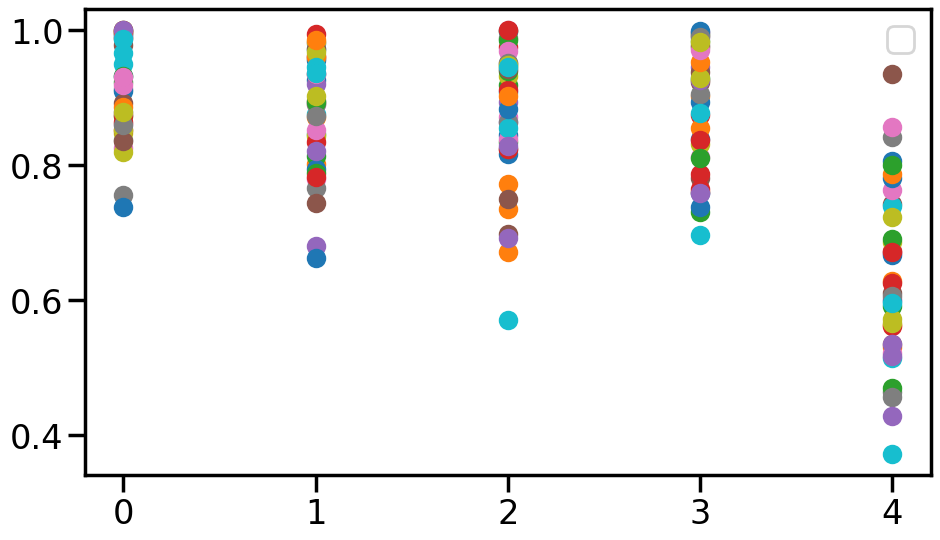

In [460]:
# Number of folds
n_splits = 4
n_repeats = 20
rskf = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_repeats, random_state=42)

# List to store results for each dataset
results = []


# Iterate over each dataset
for i, s in zip(df_prueba['Session'].unique(), range(len(df_prueba['Session'].unique()))):
    df_analysis = df_prueba.loc[df_prueba['Session']==i]
    X = df_analysis[['cbin1','cbin2','cbin3','cbin4','cbin5']]  # Features as DataFrame
    y = df_analysis['High Trial']  # Target as Series
      
    fold_results = []  # To store results for each fold of this dataset
    all_coefficients = []  # To store coefficients of each fold
    
    fold = 1
    for train_index, test_index in rskf.split(X, y):
        # Split the DataFrame into training and testing sets
        X_train_df = X.iloc[train_index]
        X_test_df = X.iloc[test_index]
        y_train_df = y.iloc[train_index]
        y_test_df = y.iloc[test_index]

        # Convert the split DataFrames/Series to numpy arrays
        X_train = X_train_df.to_numpy()
        X_test = X_test_df.to_numpy()
        y_train = y_train_df.to_numpy()
        y_test = y_test_df.to_numpy()

        # Initialize and fit the Logistic Regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = model.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        
        # Get the coefficients
        coefficients = model.coef_/model.coef_.max()
        all_coefficients.append(coefficients)
        
        #print(f"Dataset {i}, Fold {fold}, Accuracy: {accuracy:.4f}")
        #print(f"Coefficients: {coefficients}")

        # Compute average coefficients across all folds for this dataset
    avg_coefficients = np.mean(np.vstack(all_coefficients), axis=0)
    
    # Store the average coefficients for the current dataset
    results.append({
        'dataset_index': s + 1,
        'average_coefficients': avg_coefficients
    })

# Plotting the average coefficients for each dataset
plt.figure(figsize=(10, 6))

for result in results:
    dataset_index = result['dataset_index']
    avg_coefficients = result['average_coefficients'].flatten()
    
    #Plot the average coefficients for the dataset
    plt.scatter(np.arange(len(avg_coefficients)),avg_coefficients)
        
# Label the plot
#plt.xlabel('Features')
#plt.ylabel('Average Coefficient Value')
#plt.title('Average Coefficients Across Folds for Each Dataset')
#plt.xticks([0, 1], ['Feature1', 'Feature2'])  # Adjust this if you have more features
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [461]:
results_array = np.zeros((len(results),5))
for i in range(len(results)):
    results_array[i] = results[i]['average_coefficients']



In [440]:
print(results_array.mean(0))

[0.74754237 0.80031383 0.83058222 0.85281268 0.60849844]


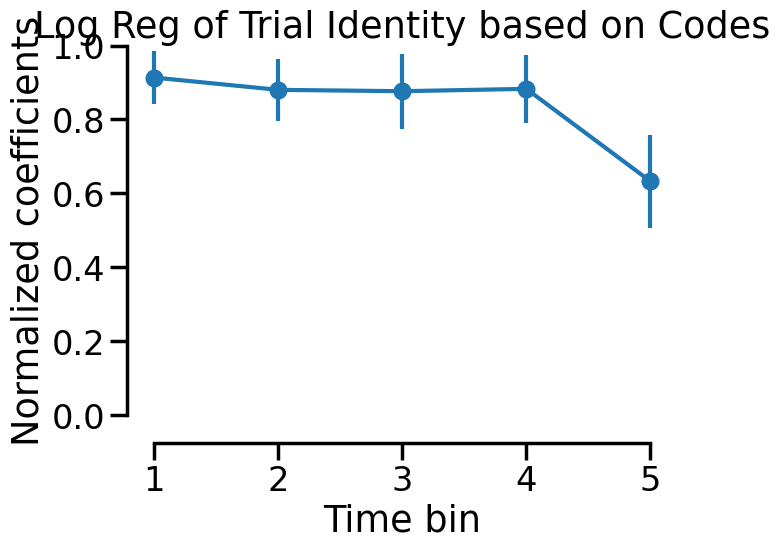

In [462]:
plt.errorbar(np.arange(1,6), results_array.mean(0), results_array.std(0), marker="o", clip_on=False)
plt.xlabel('Time bin')
plt.ylabel('Normalized coefficients')
plt.title('Log Reg of Trial Identity based on Codes')
plt.xticks(np.arange(1,6))
plt.xlim(1,5)
plt.ylim(0,1)
sns.despine(offset=20)

In [ ]:
score_choice_cum = np.zeros((len(df_prueba['Session'].unique()),5))
perm_choice_cum = np.zeros((len(df_prueba['Session'].unique()),5,1000))
pvalue_choice = np.zeros((len(df_prueba['Session'].unique()),5))
# print(score_choice.shape)


for i, s in zip(df_prueba['Session'].unique(), range(len(df_prueba['Session'].unique()))):
    print(s)
    df_analysis = df_prueba.loc[df_prueba['Session']==i]
    clf1 = LogisticRegression(solver='liblinear').fit(df_analysis[['cbin1']].to_numpy(), df_analysis['High Choice'].to_numpy())
    clf2 = LogisticRegression(solver='liblinear').fit(df_analysis[['cbin2']].to_numpy(), df_analysis['High Choice'].to_numpy())
    clf3 = LogisticRegression(solver='liblinear').fit(df_analysis[['cbin3']].to_numpy(), df_analysis['High Choice'].to_numpy())
    clf4 = LogisticRegression(solver='liblinear').fit(df_analysis[['cbin4']].to_numpy(), df_analysis['High Choice'].to_numpy())
    clf5 = LogisticRegression(solver='liblinear').fit(df_analysis[['cbin5']].to_numpy(), df_analysis['High Choice'].to_numpy())
    clf6 = LogisticRegression(solver='liblinear').fit(df_analysis[['cbin1','cbin2']].to_numpy(), df_analysis['High Choice'].to_numpy())
    clf7 = LogisticRegression(solver='liblinear').fit(df_analysis[['cbin1','cbin2','cbin3']].to_numpy(), df_analysis['High Choice'].to_numpy())
    clf8 = LogisticRegression(solver='liblinear').fit(df_analysis[['cbin1','cbin2','cbin3','cbin4']].to_numpy(), df_analysis['High Choice'].to_numpy())
    clf9 = LogisticRegression(solver='liblinear').fit(df_analysis[['cbin1','cbin2','cbin3','cbin4','cbin5']].to_numpy(), df_analysis['High Choice'].to_numpy())

    # X = df_analysis[['cbin1']].to_numpy()
    # y = df_analysis['High Choice'].to_numpy()

    # print(type(X), X.shape)
    # print(type(y), y.shape)

    cv = StratifiedKFold(5, shuffle=True)#, random_state=0)

    score_choice_cum[s,0], perm_choice_cum[s,0,:],_ = permutation_test_score(clf1, df_analysis[['cbin1']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                    scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,1], perm_choice_cum[s,1,:],_ = permutation_test_score(clf2, df_analysis[['cbin1','cbin2']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                    scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,2], perm_choice_cum[s,2,:],_ = permutation_test_score(clf3, df_analysis[['cbin1','cbin2','cbin3']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,3], perm_choice_cum[s,3,:],_ = permutation_test_score(clf4, df_analysis[['cbin1','cbin2','cbin3','cbin4']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,4], perm_choice_cum[s,4,:],_ = permutation_test_score(clf5, df_analysis[['cbin1','cbin2','cbin3','cbin4','cbin5']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)

print(score_choice_cum.mean(0))
print(score_choice_cum.std(0))

In [ ]:
    
def worker(x):
    clf1 = LogisticRegression().fit(X1, y)
    clf2 = LogisticRegression().fit(X2, y)
    clf3 = LogisticRegression().fit(X3, y)
    clf4 = LogisticRegression().fit(X4, y)
    clf5 = LogisticRegression().fit(X5, y)
    accuracy = [clf1.score(X1,y)*100,clf4.score(X4,y)*100,clf2.score(X2,y)*100,clf3.score(X3,y)*100, clf5.score(X5,y)*100]
    #print(clf3.coef_[0][0:15])
    #weights = clf3.coef_[0][0:15]
    weights_2 = clf2.coef_[0][0:15]/clf2.coef_[0][0:15].max()
    weights_3 = clf3.coef_[0][0:15]/clf3.coef_[0][0:15].max() #[0:15] [0:15]
    #print(weights)
    #weights = weights/weights.max()
    #print(weights)
    weights_shuffled = clf5.coef_[0][0:15]/clf5.coef_[0][0:15].max() #[0:15]
    #weights_shuffled = weights_shuffled/weights_shuffled.max()
    trial_history = clf3.coef_[0][15:]/clf3.coef_[0][15:].max() #[35:14:-1] [0:15]
    #print(trial_history)
    return accuracy,weights_2,weights_3,trial_history,weights_shuffled

output = list()
    
for i in tnrange(num_iter):
    output.append(worker(0))

In [393]:
score_choice_cum = np.zeros((len(df_prueba['Session'].unique()),5))
perm_choice_cum = np.zeros((len(df_prueba['Session'].unique()),5,1000))
pvalue_choice = np.zeros((len(df_prueba['Session'].unique()),5))
# print(score_choice.shape)


for i, s in zip(df_prueba['Session'].unique(), range(len(df_prueba['Session'].unique()))):
    print(s)
    df_analysis = df_prueba.loc[df_prueba['Session']==i]
    clf1 = LogisticRegression(solver='liblinear')
    clf2 = LogisticRegression(solver='liblinear')
    clf3 = LogisticRegression(solver='liblinear')
    clf4 = LogisticRegression(solver='liblinear')
    clf5 = LogisticRegression(solver='liblinear')

    # X = df_analysis[['cbin1']].to_numpy()
    # y = df_analysis['High Choice'].to_numpy()

    # print(type(X), X.shape)
    # print(type(y), y.shape)

    cv = StratifiedKFold(5, shuffle=True)#, random_state=0)

    score_choice_cum[s,0], perm_choice_cum[s,0,:],_ = permutation_test_score(clf1, df_analysis[['cbin1']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                    scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,1], perm_choice_cum[s,1,:],_ = permutation_test_score(clf2, df_analysis[['cbin1','cbin2']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                    scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,2], perm_choice_cum[s,2,:],_ = permutation_test_score(clf3, df_analysis[['cbin1','cbin2','cbin3']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,3], perm_choice_cum[s,3,:],_ = permutation_test_score(clf4, df_analysis[['cbin1','cbin2','cbin3','cbin4']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,4], perm_choice_cum[s,4,:],_ = permutation_test_score(clf5, df_analysis[['cbin1','cbin2','cbin3','cbin4','cbin5']].to_numpy(), df_analysis['High Choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)

print(score_choice_cum.mean(0))
print(score_choice_cum.std(0))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
[0.72110232 0.76975373 0.79429634 0.81080433 0.81924361]
[0.0470928  0.04160339 0.04243874 0.04649966 0.04252227]


In [144]:
score_choice_cum = np.zeros((len(df_prueba['Session'].unique()),5))
perm_choice_cum = np.zeros((len(df_prueba['Session'].unique()),5,1000))
pvalue_choice = np.zeros((len(df_prueba['Session'].unique()),5))
# print(score_choice.shape)


for i, s in zip(df_prueba['Session'].unique(), range(len(df_prueba['Session'].unique()))):
    print(s)
    df_analysis = df_prueba.loc[df_prueba['Session']==i]
    clf1 = LogisticRegression(solver='liblinear')
    clf2 = LogisticRegression(solver='liblinear')
    clf3 = LogisticRegression(solver='liblinear')
    clf4 = LogisticRegression(solver='liblinear')
    clf5 = LogisticRegression(solver='liblinear')

    # X = df_analysis[['cbin1']].to_numpy()
    # y = df_analysis['High Choice'].to_numpy()

    # print(type(X), X.shape)
    # print(type(y), y.shape)

    cv = StratifiedKFold(5, shuffle=True)#, random_state=0)

    score_choice_cum[s,0], perm_choice_cum[s,0,:],_ = permutation_test_score(clf1, df_analysis[['Sbin_1']].to_numpy(), df_analysis['High_choice'].to_numpy(), 
                                                    scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,1], perm_choice_cum[s,1,:],_ = permutation_test_score(clf2, df_analysis[['Sbin_1','Sbin_2']].to_numpy(), df_analysis['High_choice'].to_numpy(), 
                                                    scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,2], perm_choice_cum[s,2,:],_ = permutation_test_score(clf3, df_analysis[['Sbin_1','Sbin_2','Sbin_3']].to_numpy(), df_analysis['High_choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,3], perm_choice_cum[s,3,:],_ = permutation_test_score(clf4, df_analysis[['Sbin_1','Sbin_2','Sbin_3','Sbin_4']].to_numpy(), df_analysis['High_choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)
    
    score_choice_cum[s,4], perm_choice_cum[s,4,:],_ = permutation_test_score(clf5, df_analysis[['Sbin_1','Sbin_2','Sbin_3','Sbin_4','Sbin_5']].to_numpy(), df_analysis['High_choice'].to_numpy(), 
                                                     scoring="accuracy", cv=cv, n_permutations=1000, n_jobs=-1)

print(score_choice_cum.mean(0))
print(score_choice_cum.std(0))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
[0.61162164 0.63288177 0.64596019 0.66602009 0.67566327]
[0.0601255  0.06920752 0.08129375 0.08433071 0.08785769]


In [145]:
perm_choice_cum_median = np.zeros(5)
perm_choice_cum_std = np.zeros(5)

for i in range(5):
    perm_choice_cum_median[i] = np.median(perm_choice_cum[:,i,:])
    perm_choice_cum_std[i] = perm_choice_cum[:,i,:].std()
#print(score_choice_cum.std(0))

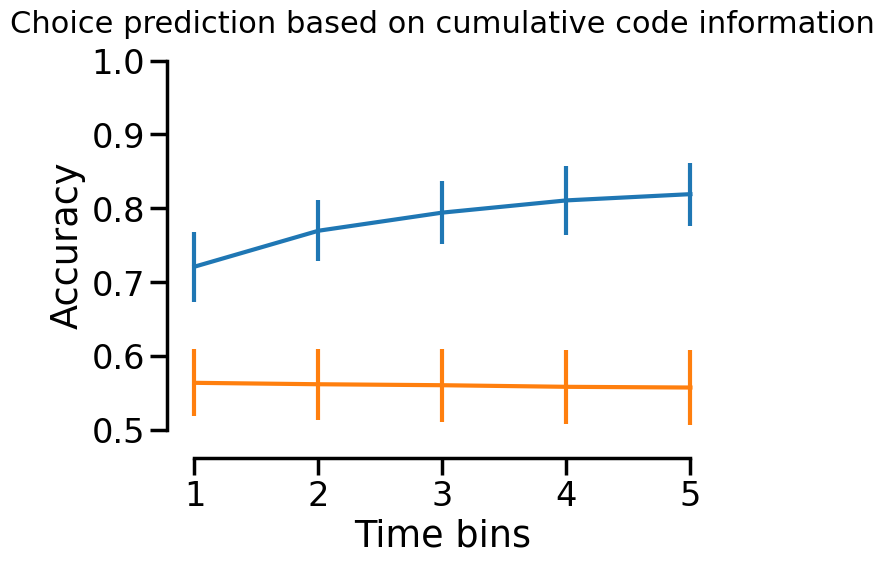

In [453]:
plt.errorbar(x=np.arange(1,6), y=score_choice_cum.mean(0), yerr=score_choice_cum.std(0), clip_on=False)
plt.errorbar(x=np.arange(1,6), y=perm_choice_cum_median, yerr=perm_choice_cum_std, clip_on=False)
plt.xlabel('Time bins')
plt.ylabel('Accuracy')
plt.xticks(np.arange(1,6))
plt.xlim(1,5)
plt.ylim(0.5,1)
plt.title('Choice prediction based on cumulative code information', fontsize='small', pad=20)
sns.despine(offset=20)


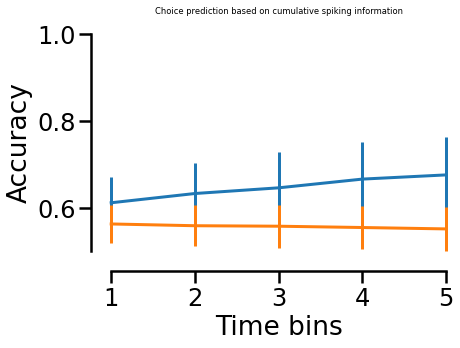

In [146]:
plt.errorbar(x=np.arange(1,6), y=score_choice_cum.mean(0), yerr=score_choice_cum.std(0), clip_on=False)
plt.errorbar(x=np.arange(1,6), y=perm_choice_cum_median, yerr=perm_choice_cum_std, clip_on=False)
plt.xlabel('Time bins')
plt.ylabel('Accuracy')
plt.xticks(np.arange(1,6))
plt.xlim(1,5)
plt.ylim(0.5,1)
plt.title('Choice prediction based on cumulative spiking information', fontsize='small', pad=20)
sns.despine(offset=20)

In [ ]:
df_shorthair_good_cells = pd.DataFrame(results_list)
df_shorthair_good_cells.to_pickle('df_shorthair_good_cells.pkl')

In [34]:
df_tabby_good_cells = pd.DataFrame(results_list)
df_tabby_good_cells.to_pickle('df_tabby_good_cells.pkl')

In [46]:
df_good_cells = pd.concat([df_bengal_good_cells, df_shorthair_good_cells, df_tabby_good_cells], axis=0).reset_index(drop=True)

In [41]:
df_shorthair_good_cells['Spike times'][0]

[63430, 103580]

In [5]:
new_path = os.getcwd() + '/Bahareh/'
#good_neurons_dic = pickle.load(open("good_cells_BST.pickle", "rb",))
#datax = str('_data_all.npy')

animal_list = [['Tabby'],['Shorthair'],['Bengal']]
session_id = 0
s_fnames_list = []
results_list=list()
    
for animals in animal_list:
    fname_list = list()
    for date_number in range(20190419,20190600):
        date_string = str(date_number)
        for animal in animals:
            fname = animal + '_' + date_string + '_' + str(session_id)+ '.pickle'
            #print(fname)
            cell_fname = new_path + 'cell_' + fname
            session_fname = new_path + 'session_' + fname
            if os.path.isfile(cell_fname) and os.path.isfile(session_fname):
                fname_list.append(fname[:-7])
              
    sorted_fname_list = sorted(fname_list, reverse=True)
    s_fnames_list.append(sorted_fname_list)
    list_of_sessions = len(sorted_fname_list)
    
    for i_session in range(list_of_sessions):

        animal_name = sorted_fname_list[i_session]
        print('session name', animal_name)
        session_fname = 'session_' + animal_name + '.pickle'
        cell_fname = 'cell_' + animal_name + '.pickle'
        #good_cells = good_neurons_dic[animal_name]
        # print(animal_name)
        # print(good_cells)
        
        # dat = np.load(new_path+animal_name+datax, allow_pickle=True)
        # data = dat.tolist()
        # codex = np.load(animal_name+cod)
        # kernel = np.load(animal_name+kern)
        # phaseweights = np.load(animal_name+phasew)

         
        session = pickle.load(open(new_path+session_fname,'rb'))[0]
        cell_list = pickle.load(open(new_path+cell_fname,'rb'))
        cell_x = cell_list[0]

        #print(cell_x['num_trials'])


        num_trials = min(session['num_trials'], cell_x['num_trials'] )
        #num_trials = session['num_trials']
        #print('num_trials', num_trials)
        non_idle_trials = np.invert(session['idle_trials'])[:num_trials]
        #print(np.count_nonzero(non_idle_trials))
        #print(len(session['correct_trials']),session['correct_trials'])
        #correct_trials = session['correct_trials'][:num_trials][non_idle_trials]
        high_trials = session['high_trials'][:num_trials][non_idle_trials]
        low_trials = session['low_trials'][:num_trials][non_idle_trials]
        trial_odor = session['trial_odor'][:num_trials][non_idle_trials][0:5000]
        #print(len(trial_odor))
        #high_choices = (correct_trials==high_trials)
        breathing_signal = np.append(session['trial_pre_breath'][:num_trials][non_idle_trials, -2500:],
                                     session['trial_breath'][:num_trials][non_idle_trials, :6500], axis=1)
        cum_odor = np.ceil(trial_odor.sum(axis=1)/5000)
        #print(len(cum_odor))
        #sniff_hist = get_sniff_histogram(session,False)[:num_trials][non_idle_trials]
        high_seven = cum_odor>8
        low_eight = cum_odor<=8
        bad_trials_1 = np.logical_and(high_seven,low_trials)
        bad_trials_2 = np.logical_and(low_eight,high_trials)
        bad_trials = np.logical_or(bad_trials_1,bad_trials_2)
        #print(np.count_nonzero(bad_trials))
        good_trials = np.invert(bad_trials)
        #all_correct_trials = correct_trials[good_trials]
        #all_high_trials = high_trials[good_trials]
        #all_low_trials = low_trials[good_trials]
        #all_high_choices = high_choices[good_trials]
        all_cum_odor = cum_odor[good_trials]
        #print(len(all_correct_trials), len(good_trials))
        all_trial_odor = trial_odor[good_trials,:]
        all_breathing = breathing_signal[good_trials,:]
        #all_sniff_hist = sniff_hist[good_trials,:]

        good_cells = good_neurons_dic[animal_name]
        num_cells = len(good_cells) #kernel.shape[0]
        #print(num_cells)
        for trial in range(len(all_cum_odor)):
            for cell in range(num_cells):
                #print(cell)

                result_row_1 = {#'Animal': animals[0],
                'Session': animal_name,
                #'Date': animal_name[-10:-2],
                'Trial': trial,
                'Total Pulse': all_cum_odor[trial].astype(int),
                #'Correct': all_correct_trials[trial].astype(int),
                #'High Choice': all_high_choices[trial].astype(int),
                'Trial odor': all_trial_odor[trial].flatten().tolist(),
                #'Odor onsets': all_trials_odor_onsets_list[i][j],
                'Breathing': all_breathing[trial].flatten().tolist(),
                'Cell': cell,
                #'Spike times': cell_list[cell]['spike_times'][trial].flatten().tolist()
                }
                results_list.append(result_row_1)

session name Tabby_20190514_0
session name Tabby_20190513_0
session name Tabby_20190512_0
session name Tabby_20190511_0
session name Tabby_20190510_0
session name Tabby_20190505_0
session name Tabby_20190504_0
session name Tabby_20190503_0
session name Tabby_20190501_0
session name Tabby_20190430_0
session name Tabby_20190427_0
session name Tabby_20190426_0
session name Tabby_20190423_0
session name Tabby_20190419_0
session name Shorthair_20190508_0
session name Shorthair_20190507_0
session name Shorthair_20190505_0
session name Shorthair_20190504_0
session name Shorthair_20190503_0
session name Shorthair_20190502_0
session name Shorthair_20190501_0
session name Shorthair_20190430_0
session name Shorthair_20190427_0
session name Shorthair_20190423_0


: 

In [14]:
tdf = pd.read_csv('df_tabby.csv')
bdf = pd.read_csv('df_bengal.csv')
sdf = pd.read_csv('df_shorthair.csv')

In [15]:
df_all_cells = pd.concat([tdf, bdf, sdf])
df_all_cells.to_csv('df_all_cells.csv', index=False)

In [16]:
df_good_cells

,Animal,Session,Date,Trial,Total Pulse,Correct,High Choice,Trial odor,Sniff histogram,Cell,Spike times
0,Tabby,Tabby_20190514_0,20190514,0,3,1,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, ...",1,"[43724, 48986, 49112, 98569, 98910, 109704, 10..."
1,Tabby,Tabby_20190514_0,20190514,0,3,1,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, ...",8,"[469, 1984, 2560, 2766, 3277, 4636, 5407, 5699..."
2,Tabby,Tabby_20190514_0,20190514,0,3,1,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, ...",14,"[2620, 2712, 5404, 5479, 8585, 15880, 16716, 1..."
3,Tabby,Tabby_20190514_0,20190514,0,3,1,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, ...",2,"[253, 547, 835, 1837, 1952, 2062, 2296, 2482, ..."
4,Tabby,Tabby_20190514_0,20190514,0,3,1,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, ...",7,"[192, 524, 2144, 2923, 3417, 4549, 5196, 8608,..."
...,...,...,...,...,...,...,...,...,...,...,...
25140,Shorthair,Shorthair_20190419_0,20190419,228,11,1,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, ...",17,"[3818, 13078, 14177, 15431, 16641, 17611, 1810..."
25141,Shorthair,Shorthair_20190419_0,20190419,228,11,1,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, ...",16,"[2490, 6406, 57202]"
25142,Shorthair,Shorthair_20190419_0,20190419,228,11,1,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, ...",26,"[310, 8521, 11532, 13799, 19527, 105737, 121032]"
25143,Shorthair,Shorthair_20190419_0,20190419,228,11,1,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, ...",1,"[104606, 108607, 122838]"


In [20]:
def transform_spike_times(lst):
    transformed_list = []

    for x in lst:
        try:
            transformed_value = (int(x)+15000)/30000
            transformed_list.append(transformed_value)
        except ValueError:
            transformed_list.append(None)
    
    return transformed_list

#
    # if lst == []:
    #     pass
    # else: 
    #     return [(int(x)+15000)/30000 for x in lst]

#df_good_cells['Spike times corr'] = df_good_cells['Spike times'].apply(transform_spike_times)
#df_good_cells

In [31]:
df_all_cells['Spike times'][30000]

30000    [518, 1013, 1476, 2600, 4162, 5387, 19327, 290...
30000       [143, 1463, 31236, 32926, 39103, 40871, 59058]
30000    [4954, 5305, 12848, 20317, 20556, 24918, 46559...
Name: Spike times, dtype: object

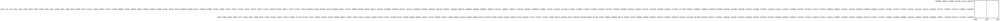

In [25]:
plt.plot(df_good_cells['Spike times'][1])

In [33]:
df_tabby_good_cells = pd.read_csv('df_tabby_good_cells.csv')

In [52]:
df_good_cells['Spike times corr'] = df_good_cells['Spike times'].apply(transform_spike_times)

In [27]:
last_test['Correct'][0]

1

In [52]:
print(type(df_tabby_good_cells['Trial odor'][0][2]))

<class 'str'>


In [53]:
df_good_cells

,Animal,Session,Date,Trial,Total Pulse,Correct,High Choice,Trial odor,Sniff histogram,Cell,Spike times,Spike times corr
0,Bengal,Bengal_20190513_0,20190513,0,21,1,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 1.0, 1.0, 0.0, 1.0, 2.0, 1.0, 2.0, 1.0, ...",9,"[5723, 6711, 9653, 10187, 14670, 20241, 20579,...","[0.6907666666666666, 0.7237, 0.821766666666666..."
1,Bengal,Bengal_20190513_0,20190513,0,21,1,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 1.0, 1.0, 0.0, 1.0, 2.0, 1.0, 2.0, 1.0, ...",10,"[104, 397, 615, 930, 1256, 1520, 1852, 2003, 2...","[0.5034666666666666, 0.5132333333333333, 0.520..."
2,Bengal,Bengal_20190513_0,20190513,0,21,1,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 1.0, 1.0, 0.0, 1.0, 2.0, 1.0, 2.0, 1.0, ...",8,"[7745, 8140, 8627, 11513, 12737, 13956, 14851,...","[0.7581666666666667, 0.7713333333333333, 0.787..."
3,Bengal,Bengal_20190513_0,20190513,0,21,1,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 1.0, 1.0, 0.0, 1.0, 2.0, 1.0, 2.0, 1.0, ...",6,"[4618, 9834, 10830, 29646, 37380, 59999, 60553...","[0.6539333333333334, 0.8278, 0.861, 1.4882, 1...."
4,Bengal,Bengal_20190513_0,20190513,0,21,1,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 1.0, 1.0, 0.0, 1.0, 2.0, 1.0, 2.0, 1.0, ...",21,"[79629, 98158]","[3.1543, 3.771933333333333]"
...,...,...,...,...,...,...,...,...,...,...,...,...
95067,Tabby,Tabby_20190419_0,20190419,172,14,0,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 0.0, 2.0, 2.0, 0.0, 1.0, 1.0, 2.0, 2.0, ...",5,"[7953, 9129, 9614, 11231, 11587, 14613, 22959,...","[0.7651, 0.8043, 0.8204666666666667, 0.8743666..."
95068,Tabby,Tabby_20190419_0,20190419,172,14,0,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 0.0, 2.0, 2.0, 0.0, 1.0, 1.0, 2.0, 2.0, ...",2,"[55785, 88032, 125259, 128076]","[2.3595, 3.4344, 4.6753, 4.7692]"
95069,Tabby,Tabby_20190419_0,20190419,172,14,0,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 0.0, 2.0, 2.0, 0.0, 1.0, 1.0, 2.0, 2.0, ...",4,[90397],[3.5132333333333334]
95070,Tabby,Tabby_20190419_0,20190419,172,14,0,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 0.0, 2.0, 2.0, 0.0, 1.0, 1.0, 2.0, 2.0, ...",1,"[592, 1725, 3097, 5130, 5315, 6905, 7664, 7833...","[0.5197333333333334, 0.5575, 0.603233333333333..."


In [54]:
df_good_cells.to_pickle('df_good_cells.pkl')

In [151]:
df_all

,Animal,Session,Date,Trial,Total Pulse,High Trial,High Choice,Correct,Cell,Spike times
0,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,1,"[1.9574666666666667, 2.1328666666666667, 2.137..."
1,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,8,"[0.5156333333333334, 0.5661333333333334, 0.585..."
2,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,14,"[0.5873333333333334, 0.5904, 0.680133333333333..."
3,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,2,"[0.5084333333333333, 0.5182333333333333, 0.527..."
4,Tabby,Tabby_20190514_0,20190514,0,3,0,0,1,7,"[0.5064, 0.5174666666666666, 0.571466666666666..."
...,...,...,...,...,...,...,...,...,...,...
95067,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,10,"[2.2700666666666667, 3.8309, 3.8561666666666667]"
95068,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,3,"[3.6718, 4.5687, 4.768633333333334]"
95069,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,7,"[0.5664, 0.5755333333333333, 0.581, 0.61483333..."
95070,Bengal,Bengal_20190419_0,20190419,246,5,0,0,1,11,"[0.501, 0.5212, 0.5597333333333333, 0.74036666..."


In [31]:
df_test_new = df_all.loc[df_all['Session']=='Tabby_20190514_0']
df_grouped_test = df_test_new.groupby(['Trial', 'High Trial', 'Total Pulse', 'High Choice'])['Cell'].sum().reset_index()
df_grouped_test.head(20)

,Trial,High Trial,Total Pulse,High Choice,Cell
0,0,0,3,0,113
1,1,1,13,1,113
2,2,0,4,0,113
3,3,1,15,1,113
4,4,0,5,0,113
5,5,0,1,0,113
6,6,1,14,1,113
7,7,0,2,0,113
8,8,0,5,1,113
9,9,1,11,1,113


In [10]:
def display_events(df):
    for index, row in df.iterrows():
        neuron_id = row['Cell']
        events = row['Spike times']
        print(f"Neuron {neuron_id} has events: {events}")

# Call the function
display_events(df)


NameError: name 'df' is not defined

In [37]:
neuron_ids = df_test_new['Cell'].unique()

# Initialize a new DataFrame
new_df = pd.DataFrame()

# Step 2: Loop through the neurons and populate the new DataFrame
for neuron_id in neuron_ids:
    new_df[f'Neuron_{neuron_id}'] = df_test_new.loc[df_test_new['Cell'] == neuron_id, 'Spike times'].reset_index(drop=True)

# Display the new DataFrame
new_df['High_choice'] = df_grouped_test['High Choice']
new_df['High_trial'] = df_grouped_test['High Trial']

def count_events(events):
    if events is not None:  # Ensure that there are events in the cell
        return sum(event <4.5 for event in events)  # Count events > 4.1
    return 0  # Return 0 for empty cells

# Apply the counting to all neuron columns
for column in new_df.columns:
    if column.startswith('Neuron_'):  # Apply to neuron columns only
        new_df[column] = new_df[column].apply(count_events)

new_df.shape

(336, 12)

In [38]:
# Step 1: Separate features (neuron columns) and target (column A)
X = new_df.drop(columns=['High_choice', 'High_trial']).to_numpy()  # Neuron columns as features
y = new_df['High_choice'].values  # Target variable

# Step 2: Scale the neuron columns
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Scale the neuron columns

print(X_scaled)

# Step 3: Define the logistic regression model
log_reg = LogisticRegression(solver='liblinear')

cv = StratifiedKFold(5, shuffle=True, random_state=0)

# Step 4: Perform cross-validation (e.g., 5-fold cross-validation)
cv_scores, perm_choice , p_value  = permutation_test_score(log_reg, X_scaled, y, cv=5, scoring='accuracy', n_permutations=1000, n_jobs=-1)

# Step 5: Print the cross-validation scores
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean cross-validation accuracy: {cv_scores.mean()}")
print(f"Mean perm accuracy: {perm_choice.mean()}")
print(f"p-value: {p_value}")

[[-0.86618201  0.04088866  1.70690613 ...  1.03197174  1.08367912
   1.53695988]
 [ 0.78743819  0.88489766  3.13802394 ... -0.08057106  2.14318306
   1.31629722]
 [-0.42521662  0.60356133  1.92157381 ... -0.08057106  1.20140178
  -0.3301857 ]
 ...
 [ 1.33864493  0.83800827 -0.36821469 ... -0.08057106 -1.38849672
  -2.16338318]
 [ 2.93714445  1.49445972  1.34912668 ...  0.66112414 -0.56443811
  -1.67113571]
 [ 1.00792089  1.166234   -0.08199112 ...  1.40281934 -0.44671545
  -1.58626546]]
Cross-validation scores: 0.8185250219490783
Mean cross-validation accuracy: 0.8185250219490783
Mean perm accuracy: 0.5086549604916594
p-value: 0.000999000999000999


In [21]:
new_df

,Neuron_1,Neuron_8,Neuron_14,Neuron_2,Neuron_7,Neuron_12,Neuron_18,Neuron_11,Neuron_19,Neuron_21,High_choice,High_trial
0,0,10,5,27,12,25,1,0,10,45,0,0
1,5,14,8,41,24,8,1,0,6,56,0,0
2,0,10,6,19,7,9,0,0,4,42,0,0
3,0,19,12,26,17,12,1,2,1,37,0,0
4,1,13,6,34,9,9,1,0,3,36,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
331,0,6,3,10,9,6,1,0,4,34,1,1
332,2,15,3,26,16,12,0,1,5,24,1,1
333,2,26,7,36,11,13,0,0,0,16,1,1
334,3,19,6,44,22,19,2,0,1,27,1,1


In [14]:
# import scikit.learn as sklearn
from sklearn.preprocessing import StandardScaler


In [189]:
new_df.loc[(new_df['Neuron_1']==0) & (new_df['Neuron_8']==10)]

,Neuron_1,Neuron_8,Neuron_14,Neuron_2,Neuron_7,Neuron_12,Neuron_18,Neuron_11,Neuron_19,Neuron_21,High_choice,High_trial
0,0,10,5,27,12,25,1,0,10,45,0,0
2,0,10,6,19,7,9,0,0,4,42,0,0
82,0,10,0,12,8,5,2,0,0,52,1,0
110,0,10,1,18,11,5,5,0,1,55,1,1
191,0,10,3,15,8,8,0,1,0,67,0,1
216,0,10,2,28,8,10,0,0,2,50,1,1
222,0,10,3,21,6,8,5,0,0,34,0,0
285,0,10,7,24,16,3,0,0,6,49,0,0
306,0,10,3,26,23,10,0,1,3,41,0,0


In [23]:
df_ttt = df_prueba.loc[(df_prueba['Session']=='Tabby_20190514_0') | (df_prueba['Session']=='Tabby_20190512_0')]
df_bbb = df_prueba.loc[(df_prueba['Session']=='Bengal_20190423_0') | (df_prueba['Session']=='Bengal_20190419_0')]

In [24]:
df_bbb

,Animal,Session,Trial,Total Pulse,High_trial,High_choice,Spike times,Sbin_1,Sbin_2,Sbin_3,Sbin_4,Sbin_5
0,Bengal,Bengal_20190419_0,0,5,0,1,"[0.5226333333333333, 0.5642333333333334, 0.809...",-0.288150,-0.241636,-0.370252,-0.243245,-0.382146
1,Bengal,Bengal_20190419_0,1,7,0,0,"[0.6528666666666667, 0.7066, 0.744733333333333...",-0.438663,-0.241636,-0.173054,-0.485688,-0.180346
2,Bengal,Bengal_20190419_0,2,3,0,0,"[0.8579666666666667, 1.1130666666666666, 1.367...",-0.344592,-0.338483,-0.113894,-0.465484,-0.563767
3,Bengal,Bengal_20190419_0,3,5,0,0,"[0.5888666666666666, 0.7111333333333333, 0.775...",-0.777316,-0.570918,-0.409691,-0.344263,-0.422506
4,Bengal,Bengal_20190419_0,4,16,1,1,"[0.5882333333333334, 0.6176666666666667, 0.635...",-0.175266,-0.338483,-0.449131,-0.324059,-0.624307
...,...,...,...,...,...,...,...,...,...,...,...,...
690,Bengal,Bengal_20190423_0,209,6,0,1,"[0.5142666666666666, 0.5336333333333333, 0.553...",-0.081195,-0.474070,-0.764647,-0.667520,-0.382146
691,Bengal,Bengal_20190423_0,210,10,1,1,"[0.6469666666666667, 0.6754, 0.803933333333333...",-0.702059,-0.183527,0.260781,0.504287,-0.483046
692,Bengal,Bengal_20190423_0,211,4,0,1,"[0.5226, 0.6017, 0.6253333333333333, 0.6406333...",-0.814944,-0.725875,-0.744927,-0.627113,-0.240886
693,Bengal,Bengal_20190423_0,212,4,0,1,"[0.706, 0.8166666666666667, 0.9118, 0.9918, 1....",-0.909014,-0.609657,0.063584,0.039605,-0.301426


In [25]:
f1 = 'High_trial~Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5+(1|Session)'
#f2 = 'High_trial~I(Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5)+(1|Session)'

#kf = KFold(n_splits=5, shuffle=True, random_state=42)
#accuracies = [] 

#for train_index, test_index in kf.split(df_prueba):
#    train_data, test_data = df_prueba.iloc[train_index], df_prueba.iloc[test_index]
#    print(len(train_data), len(test_data))
    
m_test = Lmer(formula = f1, family='binomial', data = df_ttt)
#m_single_coef = Lmer(formula = f2, family='binomial', data = train_data)
m_test.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")
#m_single_coef.fit(summarize=True, verbose=True, control="optimizer='bobyqa'")

#culito = m_varying_coefs.predict(test_data, verify_predictions=True)#skip_data_checks=True)
#culito2 = m_single_coef.predict(test_data, verify_predictions=True)#skip_data_checks=True)

Fitting generalized linear model using glmer (family binomial) with Wald confidence intervals...

Linear mixed model fit by maximum likelihood  ['lmerMod']
Formula: High_trial~Sbin_1+Sbin_2+Sbin_3+Sbin_4+Sbin_5+(1|Session)

Family: binomial	 Inference: parametric

Number of observations: 618	 Groups: {'Session': 2.0}

Log-likelihood: -356.887 	 AIC: 727.774

Random effects:

                Name     Var   Std
Session  (Intercept)  28.729  5.36

No random effect correlations specified

Fixed effects:



,Estimate,2.5_ci,97.5_ci,SE,OR,OR_2.5_ci,OR_97.5_ci,Prob,Prob_2.5_ci,Prob_97.5_ci,Z-stat,P-val,Sig
(Intercept),-3.397,-10.862,4.068,3.809,0.033,0.000,58.449,0.032,0.000,0.983,-0.892,0.372,
Sbin_1,1.090,0.674,1.506,0.212,2.974,1.961,4.509,0.748,0.662,0.818,5.132,0.000,***
Sbin_2,0.722,0.337,1.108,0.197,2.060,1.401,3.028,0.673,0.583,0.752,3.673,0.000,***
Sbin_3,0.902,0.486,1.318,0.212,2.465,1.626,3.737,0.711,0.619,0.789,4.251,0.000,***
Sbin_4,0.246,-0.160,0.653,0.207,1.279,0.852,1.921,0.561,0.460,0.658,1.187,0.235,
Sbin_5,0.743,0.306,1.180,0.223,2.103,1.358,3.256,0.678,0.576,0.765,3.331,0.001,***


In [26]:
culito = m_test.predict(df_bbb)# verify_predictions=True)#skip_data_checks=True)

ValueError: operands could not be broadcast together with shapes (618,) (461,) 